In [49]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sn
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import matplotlib as mpl

from sklearn.metrics import accuracy_score

# import custom functions from src folder
module_path = str(Path.cwd() / "../../src")

if module_path not in sys.path:
    sys.path.append(module_path)

from util import *

In [50]:
color = ["#e41a1c", "#377eb8"]

In [51]:
#Data constants

shapes_A = [2, 6]#[2, 2]
scales_A = [5, 3]
k_A = len(scales_A) # Number of classes
d_A = 2 # Number of dimensions
p_c_A = [1/len(shapes_A)]*len(shapes_A) # Uniform distributon over classes
tag_A = f'k_{k_A}_d{d_A}_shapes{shapes_A}_scales{scales_A}_pc{p_c_A}'.replace(" ", "")

trainfile_A = f"train_n_50000_{tag_A}"
testfile_A = f"test_n_10000_{tag_A}"
gridfile_A = f"grid_x1_x2_10000_{tag_A}"
large_gridfile_A = f"grid_r_a1_2500_{tag_A}"
test_data_A = pd.read_csv(f"data/{testfile_A}.csv")
grid_data_A = pd.read_csv(f"data/{gridfile_A}.csv")
large_grid_data_A = pd.read_csv(f"data/{large_gridfile_A}.csv")
train_data_A = pd.read_csv(f"data/{trainfile_A}.csv")
grid_xmax_A = grid_data_A["x1"].max()
large_grid_rmax_A = large_grid_data_A["r"].max()
tail_start_A = 30

shapes_B = [2, 4]#[2, 2]
scales_B = [3, 3]
k_B = len(scales_B) # Number of classes
d_B = 2 # Number of dimensions
p_c_B = [1/len(shapes_B)]*len(shapes_B) # Uniform distributon over classes
tag_B = f'k_{k_B}_d{d_B}_shapes{shapes_B}_scales{scales_B}_pc{p_c_B}'.replace(" ", "")

trainfile_B = f"train_n_50000_{tag_B}"
testfile_B = f"test_n_10000_{tag_B}"
gridfile_B = f"grid_x1_x2_10000_{tag_B}"
large_gridfile_B = f"grid_r_a1_2500_{tag_B}"
test_data_B = pd.read_csv(f"data/{testfile_B}.csv")
grid_data_B = pd.read_csv(f"data/{gridfile_B}.csv")
large_grid_data_B = pd.read_csv(f"data/{large_gridfile_B}.csv")
train_data_B = pd.read_csv(f"data/{trainfile_B}.csv")
grid_xmax_B = grid_data_B["x1"].max()
large_grid_rmax_B = large_grid_data_B["r"].max()
tail_start_B = 20

# Same for both data sets
n_train = [250, 500, 1000, 2000, 3000, 5000, 10000]
n_plots = len(n_train)
ACTIVATION = "relu"

max_err_val = [0]*n_plots
for i in range(n_plots):
    if n_train[i] < 1000:
        max_err_val[i] = 0.3
    else:
        max_err_val[i] = 0.3


In [52]:
large_r_df = large_grid_data_B.copy()[large_grid_data_B["r"] > 700]
len(large_r_df)

130

### Dataset A

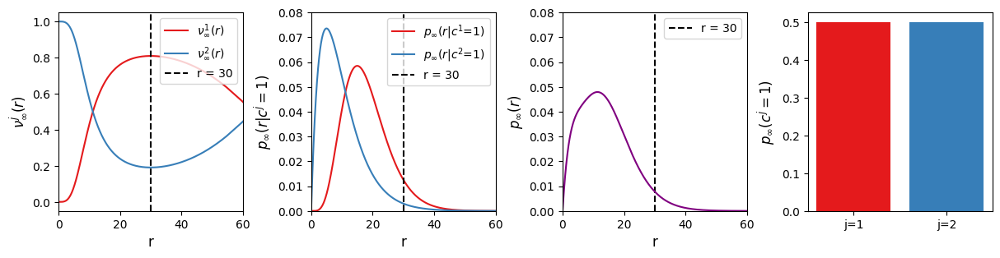

In [53]:
fig, axs = plt.subplots(nrows = 1, ncols = 4, figsize = (12, 3), layout="constrained")
for i in range(k_A):
    sn.lineplot(train_data_A, x="r", y=f"p_c{1-i}_given_r", label=rf"$\nu_{{\infty}}^{i+1}(r)$", ax=axs[0], c=color[i])
    axs[0].set_ylabel(r"$\nu_{\infty}^j(r)$", fontsize=12)
    sn.lineplot(train_data_A, x="r", y=f"p_r_given_c{1-i}", label=rf"$p_{{\infty}}(r|c^{i+1}$=1)", ax=axs[1], c=color[i])
    axs[1].set_ylabel(r"$p_{\infty}(r|c^j=1)$", fontsize=12)
    axs[3].bar(x=[f"j={i+1}" for i in range(k_A)], height=p_c_A, color=color)
    axs[3].set_ylabel(r"$p_{\infty}(c^j=1)$", fontsize=12)

axs[0].plot([tail_start_A, tail_start_A], [-0.05, 1.05], linestyle="--", color="black", label=f"r = {tail_start_A}")
axs[1].plot([tail_start_A, tail_start_A], [0, 0.08], linestyle="--", color="black", label=f"r = {tail_start_A}")
axs[2].plot([tail_start_A, tail_start_A], [0, 0.08], linestyle="--", color="black", label=f"r = {tail_start_A}")
sn.lineplot(train_data_A, x="r", y="p_r", color="purple", ax=axs[2])

axs[0].set_xlim(0, 60)
axs[1].set_xlim(0, 60)
axs[2].set_xlim(0, 60)
axs[0].set_ylim(-0.05, 1.05)
axs[1].set_ylim(0, 0.08)
axs[2].set_ylim(0, 0.08)

axs[0].set_xlabel("r", fontsize=12)
axs[1].set_xlabel("r", fontsize=12)
axs[2].set_xlabel("r", fontsize=12)
axs[2].set_ylabel(r"$p_{\infty}(r)$", fontsize=12)

axs[0].legend(loc="upper right")
axs[1].legend(loc="upper right")


fig.savefig(f"fig/dataA.pdf", format="pdf", bbox_inches='tight', dpi=350)

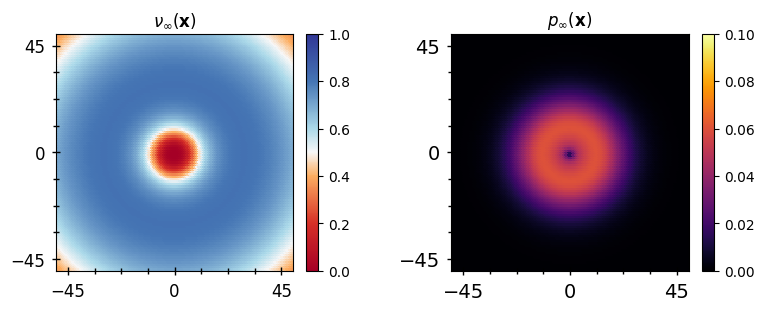

In [54]:
fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize = (8,3), layout="constrained")
axs[0] = plot_results(grid_data_A, "p_c1_given_r", axs[0], r"$\nu_{\infty}(\mathbf{x})$", grid=True, rmax=grid_xmax_A)
hue_norm = mpl.colors.Normalize(vmin=0, vmax=1, clip=False)
fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=red_blue_cmap()), fraction=0.050, pad=0.04, ax=axs[0])

axs[1] = plot_std(grid_data_A, "p_r", axs[1], r"$p_{\infty}(\mathbf{x}$)", grid=True, max_val = 0.08, rmax=grid_xmax_A)
hue_norm = mpl.colors.Normalize(vmin=0, vmax=0.1, clip=False)
fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap="inferno"), fraction=0.050, pad=0.04, ax=axs[1])

#fig.savefig(f"../fig/DNN_ensemble_ntrain_{n_data[i]}.pdf", format="pdf", bbox_inches='tight', dpi=350)

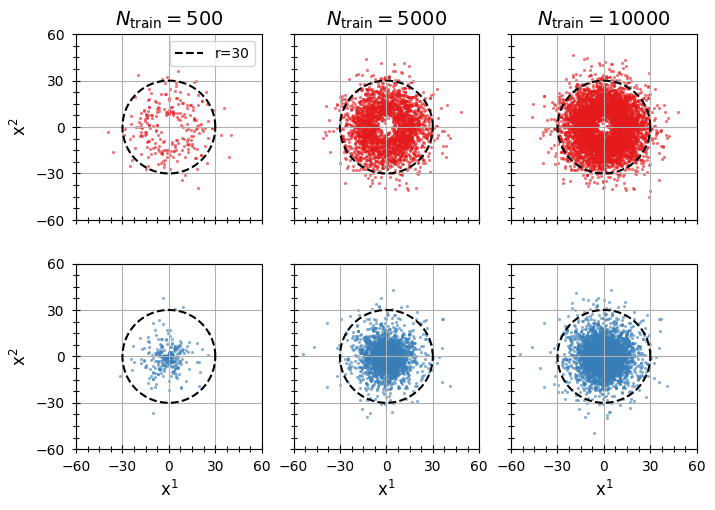

In [55]:
def plot_training_data(df, ntrain, class_label, class_color, ax):
    df_small = df[0:ntrain][df[0:ntrain]["class"]==class_label]
    sn.scatterplot(df_small, x="x1", y="x2", color=class_color, ax=ax, s=5, linewidth=0, alpha=0.6)
    #ax.set_title(rf"$n={ntrain}$", fontsize=11)
    return ax

fig, axs = plt.subplots(nrows = 2, ncols = 3, figsize = (7, 5), layout="constrained", sharex=True, sharey=True)

axs[0][0] = plot_training_data(train_data_A, 500, 1, color[0], axs[0][0])
axs[0][1] = plot_training_data(train_data_A, 5000, 1, color[0], axs[0][1])
axs[0][2] = plot_training_data(train_data_A, 10000, 1, color[0], axs[0][2])
axs[1][0] = plot_training_data(train_data_A, 500, 0, color[1], axs[1][0])
axs[1][1] = plot_training_data(train_data_A, 5000, 0, color[1], axs[1][1])
axs[1][2] = plot_training_data(train_data_A, 10000, 0, color[1], axs[1][2])

axs[0][0].set_title(r"$N_\mathrm{train}=500$", fontsize=14)
axs[0][1].set_title(r"$N_\mathrm{train}=5000$", fontsize=14)
axs[0][2].set_title(r"$N_\mathrm{train}=10000$", fontsize=14)

for ax in axs.flatten():
    #Plot circle
    xs = tail_start_A*np.cos(np.linspace(0, 2*np.pi, 300))
    ys = tail_start_A*np.sin(np.linspace(0, 2*np.pi, 300))
    ax.plot(xs, ys, linestyle="--", color="black", label=f"r={tail_start_A}")
    ax.tick_params(which="both", direction="inout", bottom=True, left=True, labelsize=10, pad=5, length=4, width=0.8)
    ax.tick_params(which="major", length=6)
    ax.set_xticks([-60, -30, 0, 30, 60])
    ax.set_yticks([-60, -30, 0, 30, 60])
    ax.set_xlabel(r"x$^1$", fontsize=12)
    ax.set_ylabel(r"x$^2$", fontsize=12)
    ax.set_aspect('equal', adjustable='box')
    ax.minorticks_on()
    ax.grid()
axs[0][0].legend()
fig.savefig(f"fig/traindata_datasetA.pdf", format="pdf", bbox_inches='tight', dpi=350)
fig.savefig(f"fig/traindata_datasetA.png", format="png", bbox_inches='tight', dpi=350)

In [56]:
# Expected accuracy on any test set sampled from this distribution
exp_acc_A = np.sum(test_data_A[[f"p_c{i}_given_r" for i in range(k_B)]].max(axis=1))/len(test_data_A)
# But in our case, we will see the actual accuracy on this test set compared to expectation
test_data_A["Expected class"] = np.array(test_data_A[[f"p_c{i}_given_r" for i in range(k_A)]]).argmax(axis=-1)
max_acc_A = accuracy_score(test_data_A["class"], test_data_A["Expected class"], normalize=True)
max_acc_A_small = accuracy_score(test_data_A["class"][0:500], test_data_A["Expected class"][0:500], normalize=True)

print("Expected accuray: ", exp_acc_A, "Max optimal accuracy test set: ", max_acc_A, "Max optimal accuracy small test set: ", max_acc_A_small)

Expected accuray:  0.7385207198110306 Max optimal accuracy test set:  0.7439 Max optimal accuracy small test set:  0.736


### Data set B

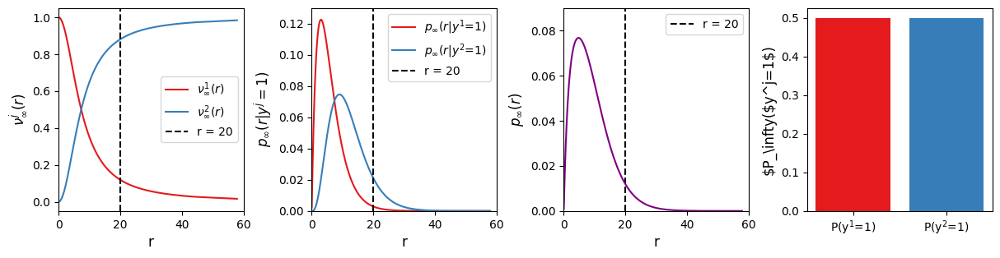

In [57]:
fig, axs = plt.subplots(nrows = 1, ncols = 4, figsize = (12, 3), layout="constrained")
for i in range(k_B):
    sn.lineplot(train_data_B, x="r", y=f"p_c{i}_given_r", label=rf"$\nu_\infty^{i+1}(r)$", ax=axs[0], c=color[i])
    axs[0].set_ylabel(r"$\nu_\infty^j(r)$", fontsize=12)
    sn.lineplot(train_data_B, x="r", y=f"p_r_given_c{i}", label=rf"$p_\infty(r|y^{i+1}$=1)", ax=axs[1], c=color[i])
    axs[1].set_ylabel(r"$p_\infty(r|y^j=1$)", fontsize=12)
    axs[3].bar(x=[f"P(y$^{i+1}$=1)" for i in range(k_B)], height=p_c_B, color=color)
    axs[3].set_ylabel(r"$P_\infty($y^j=1$)", fontsize=12)

axs[0].plot([tail_start_B, tail_start_B], [-0.05, 1.05], linestyle="--", color="black", label=f"r = {tail_start_B}")
axs[1].plot([tail_start_B, tail_start_B], [0, 0.13], linestyle="--", color="black", label=f"r = {tail_start_B}")
axs[2].plot([tail_start_B, tail_start_B], [0, 0.13], linestyle="--", color="black", label=f"r = {tail_start_B}")
sn.lineplot(train_data_B, x="r", y="p_r", color="purple", ax=axs[2])

axs[0].set_xlim(0, 60)
axs[1].set_xlim(0, 60)
axs[2].set_xlim(0, 60)
axs[0].set_ylim(-0.05, 1.05)
axs[1].set_ylim(0, 0.13)
axs[2].set_ylim(0, 0.09)

axs[0].set_xlabel("r", fontsize=12)
axs[1].set_xlabel("r", fontsize=12)
axs[2].set_xlabel("r", fontsize=12)
axs[2].set_ylabel(r"$p_\infty(r)$", fontsize=12)

axs[0].legend(loc="center right")
axs[1].legend(loc="upper right")

fig.savefig(f"fig/dataB.pdf", format="pdf", bbox_inches='tight', dpi=350)

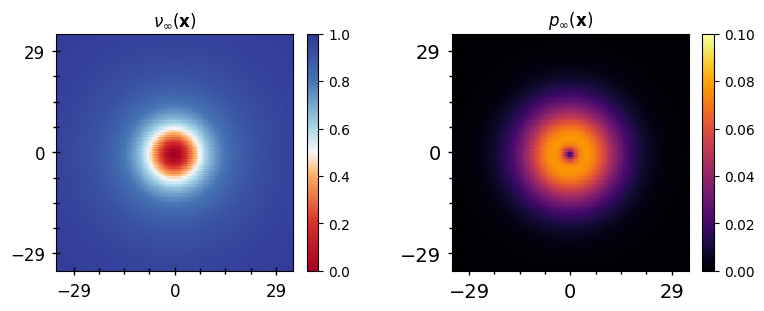

In [58]:
fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize = (8,3), layout="constrained")
axs[0] = plot_results(grid_data_B, "p_c1_given_r", axs[0], r"$\nu_\infty(\mathbf{x})$", grid=True, rmax=grid_xmax_B)
hue_norm = mpl.colors.Normalize(vmin=0, vmax=1, clip=False)
fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=red_blue_cmap()), fraction=0.050, pad=0.04, ax=axs[0])

axs[1] = plot_std(grid_data_B, "p_r", axs[1], r"$p_\infty(\mathbf{x})$", grid=True, max_val = 0.1, rmax=grid_xmax_B)
hue_norm = mpl.colors.Normalize(vmin=0, vmax=0.1, clip=False)
fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap="inferno"), fraction=0.050, pad=0.04, ax=axs[1])

#fig.savefig(f"../fig/DNN_ensemble_ntrain_{n_data[i]}.pdf", format="pdf", bbox_inches='tight', dpi=350)

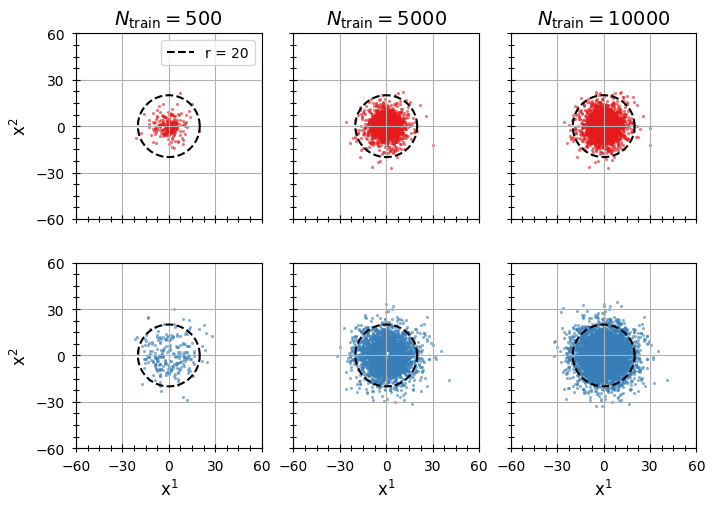

In [59]:
fig, axs = plt.subplots(nrows = 2, ncols = 3, figsize = (7, 5), layout="constrained", sharex=True, sharey=True)

axs[0][0] = plot_training_data(train_data_B, 500, 0, color[0], axs[0][0])
axs[0][1] = plot_training_data(train_data_B, 5000, 0, color[0], axs[0][1])
axs[0][2] = plot_training_data(train_data_B, 10000, 0, color[0], axs[0][2])
axs[1][0] = plot_training_data(train_data_B, 500, 1, color[1], axs[1][0])
axs[1][1] = plot_training_data(train_data_B, 5000, 1, color[1], axs[1][1])
axs[1][2] = plot_training_data(train_data_B, 10000, 1, color[1], axs[1][2])

axs[0][0].set_title(r"$N_\mathrm{train}=500$", fontsize=14)
axs[0][1].set_title(r"$N_\mathrm{train}=5000$", fontsize=14)
axs[0][2].set_title(r"$N_\mathrm{train}=10000$", fontsize=14)

for ax in axs.flatten():
    #Plot circle
    xs = tail_start_B*np.cos(np.linspace(0, 2*np.pi, 300))
    ys = tail_start_B*np.sin(np.linspace(0, 2*np.pi, 300))
    ax.plot(xs, ys, linestyle="--", color="black", label=f"r = {tail_start_B}")
    ax.tick_params(which="both", direction="inout", bottom=True, left=True, labelsize=10, pad=5, length=4, width=0.8)
    ax.tick_params(which="major", length=6)
    ax.set_xticks([-60, -30, 0, 30, 60])
    ax.set_yticks([-60, -30, 0, 30, 60])
    ax.set_xlabel(r"x$^1$", fontsize=12)
    ax.set_ylabel(r"x$^2$", fontsize=12)
    ax.set_aspect('equal', adjustable='box')
    ax.minorticks_on()
    ax.grid()
axs[0][0].legend()
fig.savefig(f"fig/traindata_datasetB.png", format="png", bbox_inches='tight', dpi=350)
fig.savefig(f"fig/traindata_datasetB.pdf", format="pdf", bbox_inches='tight', dpi=350)

In [60]:
# Expected accuracy on any test set sampled from this distribution
exp_acc_B = np.sum(test_data_B[[f"p_c{i}_given_r" for i in range(k_B)]].max(axis=1))/len(test_data_B)
# But in our case, we will see the actual accuracy on this test set compared to expectation
test_data_B["Expected class"] = np.array(test_data_B[[f"p_c{i}_given_r" for i in range(k_B)]]).argmax(axis=-1)
max_acc_B = accuracy_score(test_data_B["class"], test_data_B["Expected class"], normalize=True)
max_acc_B_small = accuracy_score(test_data_B["class"][0:500], test_data_B["Expected class"][0:500], normalize=True)

print("Expected accuray: ", exp_acc_B, ", Max optimal accuracy test set: ", max_acc_B, ", Max optimal accuracy small test set: ", max_acc_B_small)

Expected accuray:  0.7347306433676738 , Max optimal accuracy test set:  0.7367 , Max optimal accuracy small test set:  0.728


### Get results

In [61]:

model_names = ["NNE", 
               "CL",
               "EDL",
               "MCD", 
               "GP", 
               "DPMM"]
model_colors = ["#1f77b4", #blue
                "#ff7f0e", #orange
                "#2ca02c", #green
                "#d62728", #red
                "#9467bd", #purple
                "#8c564b"   #brown
                ]

pred_keys = ["Prediction", 
             "Prediction",
             "Prediction", 
             "Prediction", 
             "Prediction", 
             "Prediction"]
prob_keys = ["Est_prob_c1", 
             "Est_prob_c1", 
             "Est_prob_c1", 
             "Est_prob_c1", 
             "Est_prob_c1_MC", 
             "Est_prob_c1"]
std_keys = ["Std_prob_c1", 
            "Std_prob_c1",
            "Std_prob_c1",
            "Std_prob_c1", 
            "Std_prob_c1_MC", 
            "Std_prob_c1"]


n_models = len(model_names)

def get_dfs(tag, n_train, n_models, activation="relu"):
    def get_filename_list(prefix, tag):
        if activation == "relu":
            files = [
                [f"DNN/predictions/train_n_50000_{tag}/ensemble/{prefix}_{tag}_ndata-{n}.csv" for n in n_train],
                [f"DNN/predictions/train_n_50000_{tag}/CL/{prefix}_{tag}_ndata-{n}.csv" for n in n_train],
                [f"DNN/predictions/train_n_50000_{tag}/evidential/{prefix}_{tag}_ndata-{n}.csv" for n in n_train],
                [f"DNN/predictions/train_n_50000_{tag}/MCD/{prefix}_{tag}_ndata-{n}.csv" for n in n_train],
                [f"gaussian_process/predictions/train_n_50000_{tag}/{prefix}_{tag}_predicted_latentGP_2_ls8_ndata-{n}.csv" for n in n_train],
                [f"inferno/predictions/train_n_50000_{tag}/{prefix}_{tag}_predicted_MM_ndata-{n}.csv" for n in n_train]
            ]
        else:
            files = [
                [f"DNN/predictions/train_n_50000_{tag}/ensemble/{prefix}_{tag}_{activation}_ndata-{n}.csv" for n in n_train],
                [f"DNN/predictions/train_n_50000_{tag}/CL/{prefix}_{tag}_{activation}_ndata-{n}.csv" for n in n_train],
                [f"DNN/predictions/train_n_50000_{tag}/evidential/{prefix}_{tag}_{activation}_ndata-{n}.csv" for n in n_train],
                [f"DNN/predictions/train_n_50000_{tag}/MCD/{prefix}_{tag}_{activation}_ndata-{n}.csv" for n in n_train],
                [f"gaussian_process/predictions/train_n_50000_{tag}/{prefix}_{tag}_predicted_latentGP_2_ls8_ndata-{n}.csv" for n in n_train],
                [f"inferno/predictions/train_n_50000_{tag}/{prefix}_{tag}_predicted_MM_ndata-{n}.csv" for n in n_train]
            ]
        return files
    gridfiles = get_filename_list("grid", tag)
    large_gridfiles = get_filename_list("large_grid", tag)
    testfiles = get_filename_list("test_n_10000", tag)
    
    grid_dfs = [[pd.read_csv(gridfiles[i][j]) for j in range(len(n_train))]for i in range(n_models)]
    large_grid_dfs = [[pd.read_csv(large_gridfiles[i][j]) for j in range(len(n_train))]for i in range(n_models)]
    test_dfs = [[pd.read_csv(testfiles[i][j]) for j in range(len(n_train))]for i in range(n_models)]
    return grid_dfs, large_grid_dfs, test_dfs

grid_dfs_A, large_grid_dfs_A, test_dfs_A = get_dfs(tag_A, n_train, n_models, activation=ACTIVATION)
grid_dfs_B, large_grid_dfs_B, test_dfs_B = get_dfs(tag_B, n_train, n_models, activation=ACTIVATION)

### Metrics

In [62]:
def get_metrics(test_dfs, ood_dfs, n_train, test_data, tail_min, n_max=-1):
    scores = [calculate_metrics(test_dfs[i], ood_dfs[i], n_train, test_data, 
                           pred_keys[i], prob_keys[i], std_keys[i], tail_min, n_max=n_max) for i in range(n_models)]
    keys = ["N data", "ACC", "ROCAUC", "LogLoss", "Mean KL-div", "ECE", "WD"]
    best_score = pd.DataFrame(columns=keys)
    best_score["N data"] = n_train
    
    # Get average top level confidence
    for j in range (n_models):
        scores[j]["Q avg"] = 0.0
        scores[j]["Z"] = 0.0
        for i in range(n_plots):
            mask = test_dfs[j][i][prob_keys[j]] < 0.5
            test_dfs[j][i]["Top level confidence"] = test_dfs[j][i][prob_keys[j]]
            test_dfs[j][i].loc[mask, "Top level confidence"] = 1 - test_dfs[j][i][prob_keys[j]]
        scores[j]["Q avg"] = [test_dfs[j][i]["Top level confidence"].mean() for i in range(n_plots)]
        scores[j]["Z"] = np.abs(scores[j]["Q avg"] - scores[j]["ACC"])

    for i in range(n_plots):
        #Metrics that should be maximized
        for key in (["ACC", "ROCAUC"]):
            best_score.loc[i, key] = np.argmax([scores[j][key][i] for j in range(n_models)])
        for key in (["LogLoss", "Mean KL-div", "ECE", "WD", "Q-P dist"]):
            best_score.loc[i, key] = np.argmin([scores[j][key][i] for j in range(n_models)])
        best_score.loc[i, "Z"] = int(np.argmin([scores[j]["Z"][i] for j in range(n_models)]))

    return scores, best_score

scores_A, best_score_A = get_metrics(test_dfs_A, large_grid_dfs_A, n_train, test_data_A, tail_start_A)
scores_A_small, best_score_A_small = get_metrics(test_dfs_A, large_grid_dfs_A, n_train, test_data_A, tail_start_A, n_max=500)

scores_B, best_score_B = get_metrics(test_dfs_B, large_grid_dfs_B, n_train, test_data_B, tail_start_B)
scores_B_small, best_score_B_small = get_metrics(test_dfs_B, large_grid_dfs_B, n_train, test_data_B, tail_start_B, n_max=500)

In [63]:
def r_plots(dfs, truth, rmax, n_train, dataset_name:str, grid=False, tail_start=None):
    # A horrible function which uses global variables because I am too lazy
    for i in range(n_plots):
        # Add posteriors for flat priors

        fig, axs = plt.subplots(nrows = 2, ncols = n_models, figsize = (2.5*n_models,4.2), layout="constrained", sharex=True, sharey="row")
        hue_norm_prob = mpl.colors.Normalize(vmin=0, vmax=2*np.pi, clip=False)
        capsize = 3
        for j in range(n_models):
            # To better distinguish models
            # Bin
            r_bins = np.linspace(0, dfs[j][i]["r"].max(), 15)
            r_list = np.full(len(r_bins-1), np.nan)
            mean_p_list = np.full(len(r_bins-1), np.nan)
            mean_p_down_list = np.full(len(r_bins-1), np.nan)
            mean_p_up_list = np.full(len(r_bins-1), np.nan)
            mean_u_list = np.full(len(r_bins-1), np.nan)
            mean_u_down_list = np.full(len(r_bins-1), np.nan)
            mean_u_up_list = np.full(len(r_bins-1), np.nan)

            for k in range(len(r_bins)-1):
                #Center the x-values in the bins
                r_list[k] = r_bins[k] + (r_bins[k+1]-r_bins[k])/2
                # Only choose the values in the bin
                temp_df = dfs[j][i].copy()[dfs[j][i]["r"] > r_bins[k]]
                temp_df = temp_df.copy()[temp_df["r"] < r_bins[k+1]]
                if len(temp_df) > 0:
                    mean_p_list[k] = temp_df[f"{prob_keys[j]}"].mean()
                    if mean_p_list[k] != 0:
                        #mean_p_down_list[k] = np.percentile(temp_df[f"{prob_keys[j]}"], 5)
                        mean_p_down_list[k] = np.min(temp_df[f"{prob_keys[j]}"])
                    if mean_p_list[k] != 1:
                        #mean_p_up_list[k] = np.percentile(temp_df[f"{prob_keys[j]}"], 95)
                        mean_p_up_list[k] = np.max(temp_df[f"{prob_keys[j]}"])
                    mean_u_list[k] = temp_df[f"{std_keys[j]}"].mean()
                    if mean_u_list[k] != 0:
                        #mean_u_down_list[k] = np.percentile(temp_df[f"{std_keys[j]}"], 5)
                        mean_u_down_list[k] = np.min(temp_df[f"{std_keys[j]}"])
                    if mean_u_list[k] != 1:
                        #mean_u_up_list[k] = np.percentile(temp_df[f"{std_keys[j]}"], 95)
                        mean_u_up_list[k] = np.max(temp_df[f"{std_keys[j]}"])

            axs[0][j].errorbar(r_list, mean_p_list, yerr=(mean_p_list - mean_p_down_list, mean_p_up_list - mean_p_list),
                               linewidth=2, elinewidth=1, capsize = capsize, marker="o", color=model_colors[j], label = model_names[j])
            
            axs[1][j].errorbar(r_list, mean_u_list, yerr=(mean_u_list - mean_u_down_list, mean_u_up_list - mean_u_list),
                               linewidth=2, elinewidth=1, capsize = capsize, marker="o", color=model_colors[j], label = model_names[j])
            
            if not grid:
                sn.lineplot(truth, x="r", y="p_c1_given_r", linewidth=2, ax = axs[0][j], label=r"$\nu_{\infty}(\mathbf{x})$", c="black")
                #axs[0].legend(loc="lower right")
            
            #capsize = capsize +1

        axs[0][0].set_ylabel(rf"$\bar{{Q}}(c^1=1|\mathbf{{x}}, \mathcal{{D}}_{{{n_train[i]}}}$)", fontsize=12)
        axs[0][0].set_ylim(-0.05, 1.05)

        axs[1][0].set_ylabel(r"$u_Q(c^1=1|\mathbf{x}$)", fontsize=12)
        axs[1][0].set_ylim(-0.05, 0.35)

        if not grid:
            for ax in axs.flatten():
                ax.plot([tail_start, tail_start], [-0.1, 1.1], linestyle="--", color="black", label=f"r = {tail_start}")
            handles = [0]*(n_models+2)
            labels = [0]*(n_models+2)
            temp_handles, temp_labels = axs[0][0].get_legend_handles_labels()
            handles[0] = temp_handles[0]
            labels[0] = temp_labels[0]
            handles[1] = temp_handles[1]
            labels[1] = temp_labels[1]
        else:
            #for ax in axs[0].flatten():
            #    ax.plot([0, 1000], [0.73, 0.73], linestyle="--", color="grey", label=r"$Q = 0.73$")
            for ax in axs[1].flatten():
                ax.plot([0, 1000], [np.sqrt(0.5*0.5/3), np.sqrt(0.5*0.5/3)], linestyle="--", color="black", label=r"$u_Q = 0.5/\sqrt{3}$")
            handles = [0]*(n_models+1)
            labels = [0]*(n_models+1)
            temp_handles, temp_labels = axs[1][0].get_legend_handles_labels()
            handles[0] = temp_handles[0]
            labels[0] = temp_labels[0]
        for j in range(n_models):
            if not grid:
                temp_handles, temp_labels = axs[0][j].get_legend_handles_labels()
                handles[j+2], labels[j+2] = temp_handles[2], temp_labels[2]
            else:
                temp_handles, temp_labels = axs[1][j].get_legend_handles_labels()
                handles[j+1], labels[j+1] = temp_handles[1], temp_labels[1]
        fig.suptitle("    ", fontsize=30)
        fig.legend(handles, labels, loc='upper center', ncol=len(handles), labelspacing=0., fontsize=14)

        for ax in axs.flatten():
            ax.set_xlim(0, int(rmax+10))
            ax.grid(True)
            ax.set_xlabel(r"$|\mathbf{x}|$", fontsize=12)
            ax.tick_params(labelsize=12)
            if (ax.get_legend()):
                ax.get_legend().remove()
            

        if grid:
            if ACTIVATION=="relu":
                fig.savefig(f"fig/results_{dataset_name}_r_axis_extrapolate_{n_train[i]}.png", format="png", bbox_inches='tight', dpi=350)
                fig.savefig(f"fig/results_{dataset_name}_r_axis_extrapolate_{n_train[i]}.pdf", format="pdf", bbox_inches='tight', dpi=350)
            else:
                fig.savefig(f"fig/results_{dataset_name}_r_axis_extrapolate_{n_train[i]}_{ACTIVATION}.png", format="png", bbox_inches='tight', dpi=350)
                fig.savefig(f"fig/results_{dataset_name}_r_axis_extrapolate_{n_train[i]}_{ACTIVATION}.pdf", format="pdf", bbox_inches='tight', dpi=350)
        else:
            if ACTIVATION=="relu":
                fig.savefig(f"fig/results_{dataset_name}_r_axis_{n_train[i]}.png", format="png", bbox_inches='tight', dpi=350)
                fig.savefig(f"fig/results_{dataset_name}_r_axis_{n_train[i]}.pdf", format="pdf", bbox_inches='tight', dpi=350)
            else:
                fig.savefig(f"fig/results_{dataset_name}_r_axis_{n_train[i]}_{ACTIVATION}.png", format="png", bbox_inches='tight', dpi=350)
                fig.savefig(f"fig/results_{dataset_name}_r_axis_{n_train[i]}_{ACTIVATION}.pdf", format="pdf", bbox_inches='tight', dpi=350)


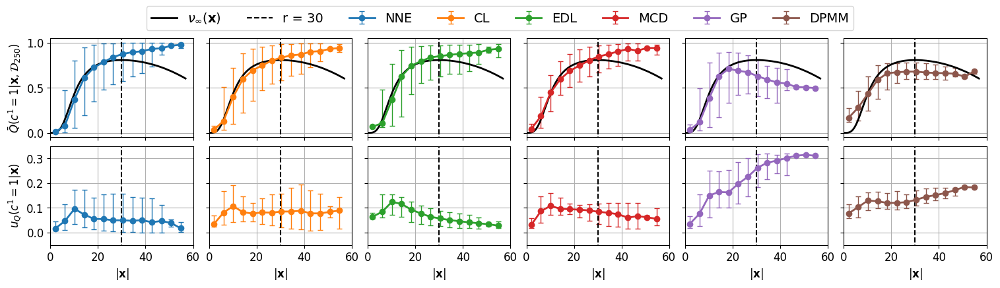

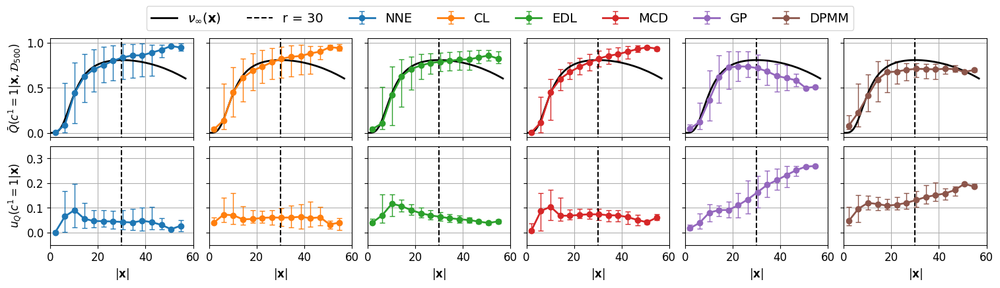

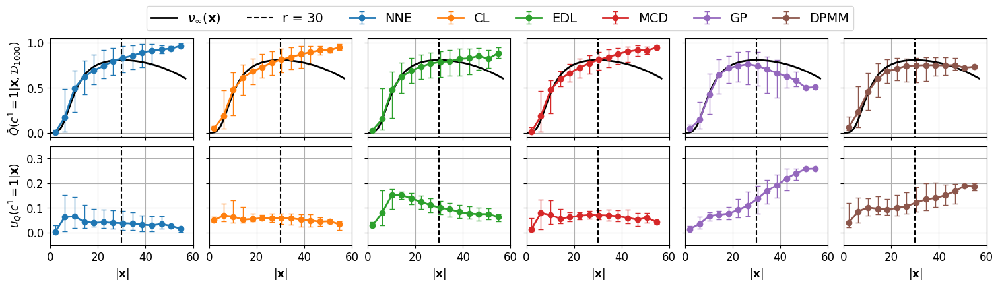

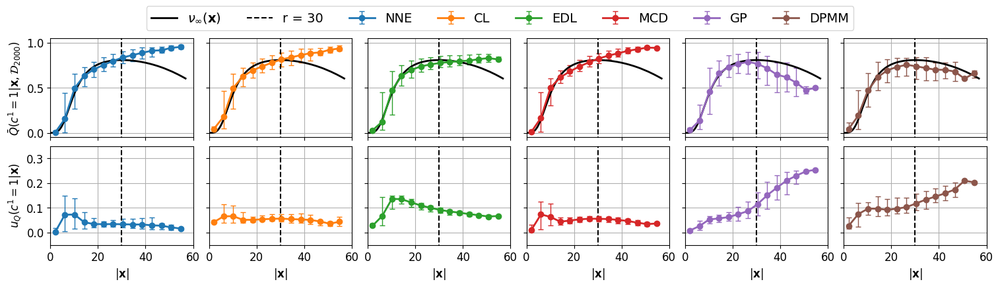

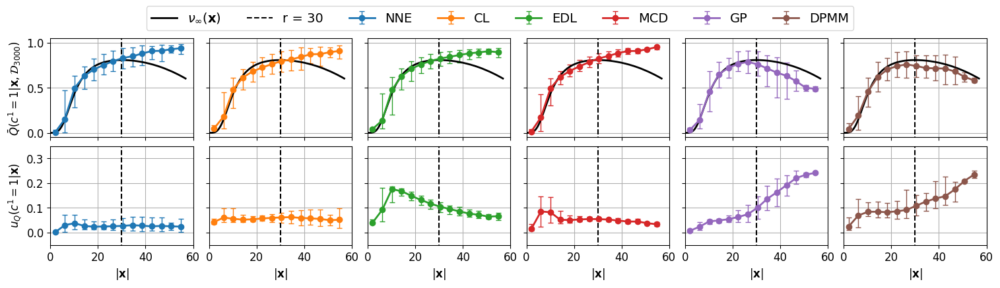

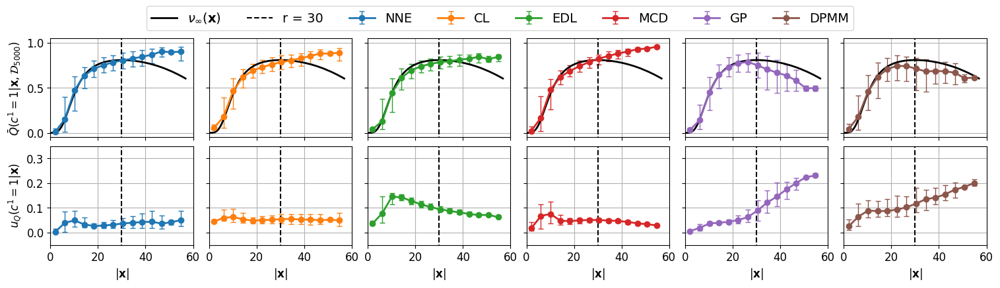

In [64]:
r_plots(test_dfs_A, test_data_A, grid_xmax_A, n_train, 
        dataset_name="datasetA", tail_start = tail_start_A)

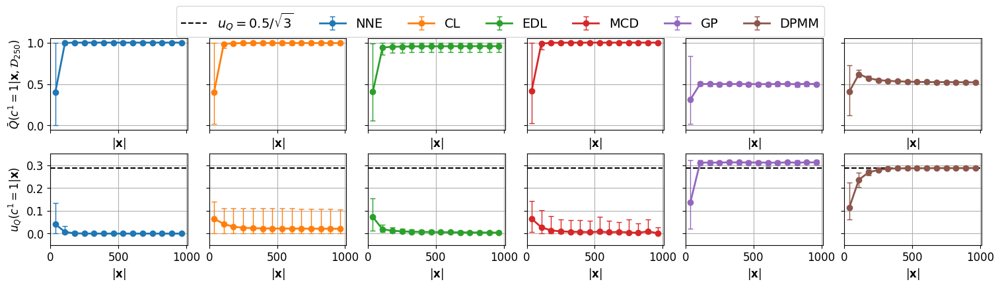

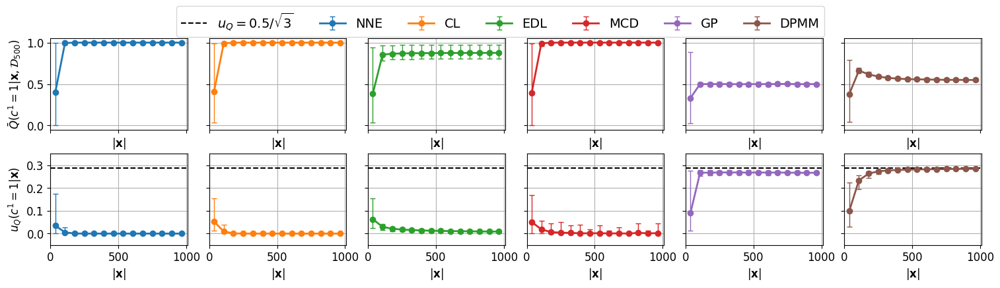

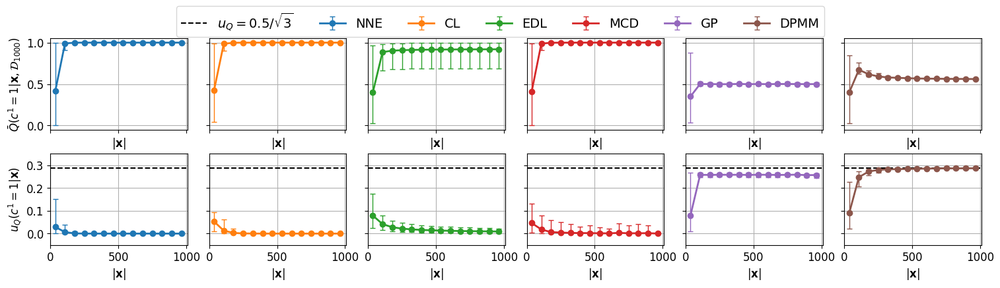

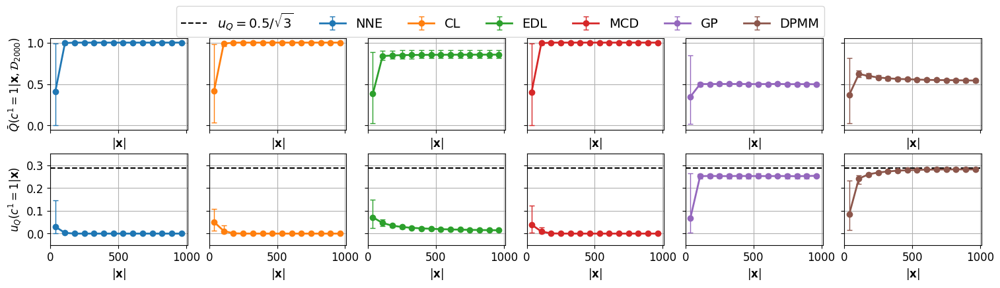

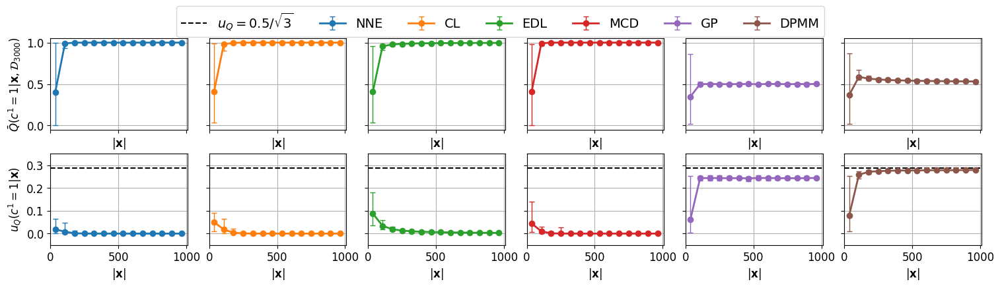

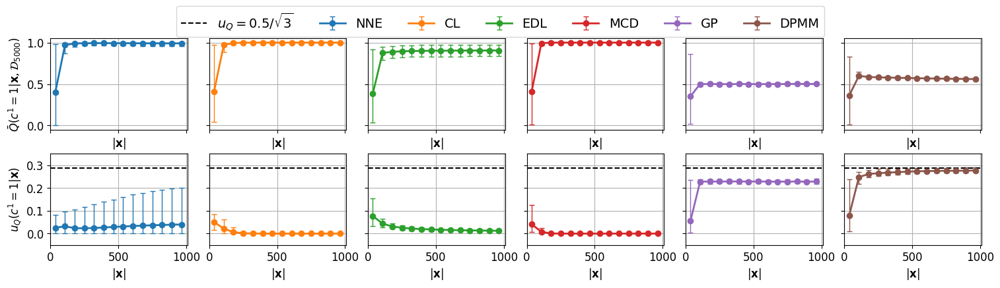

In [65]:
r_plots(large_grid_dfs_A, large_grid_data_A, large_grid_rmax_A, n_train, 
        dataset_name="datasetA", grid=True)

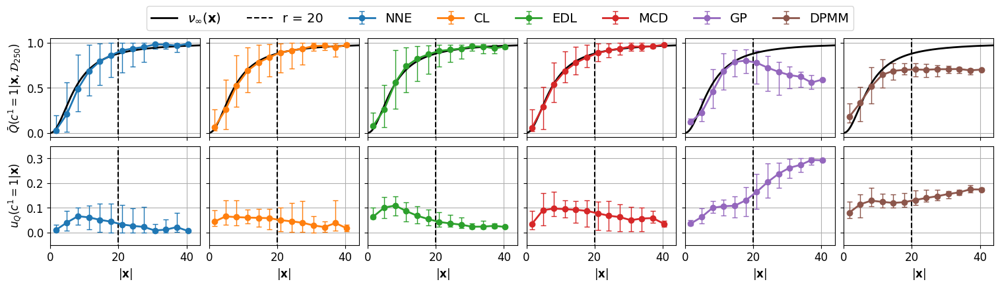

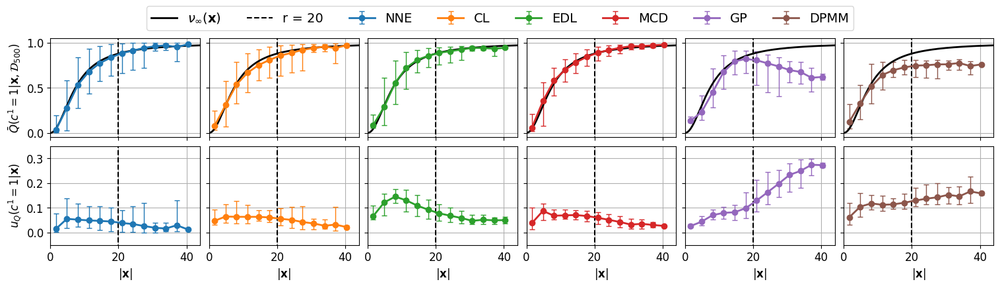

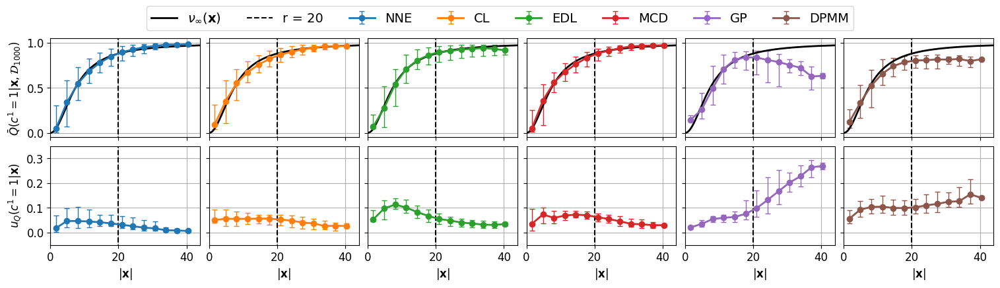

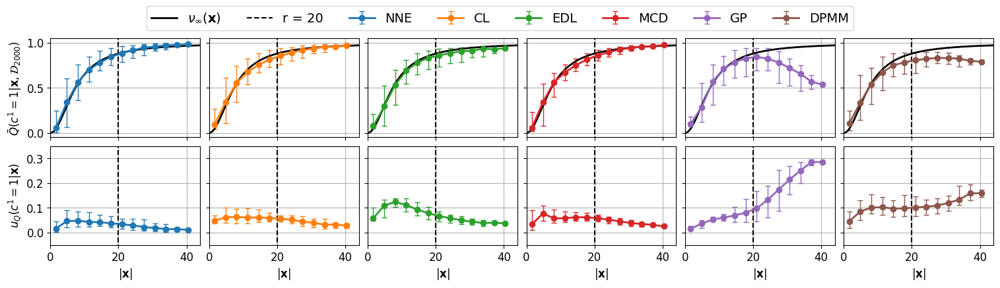

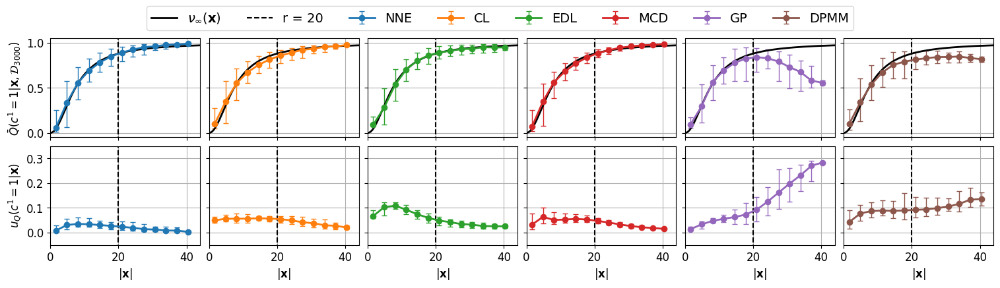

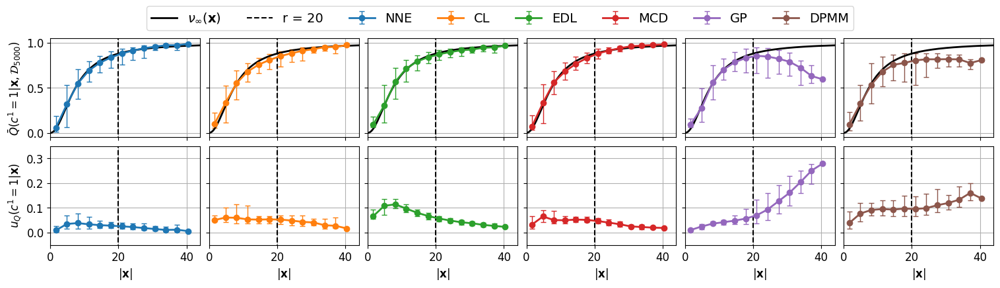

In [66]:
r_plots(test_dfs_B, test_data_B, grid_xmax_B, n_train, 
        dataset_name="datasetB", tail_start=tail_start_B)

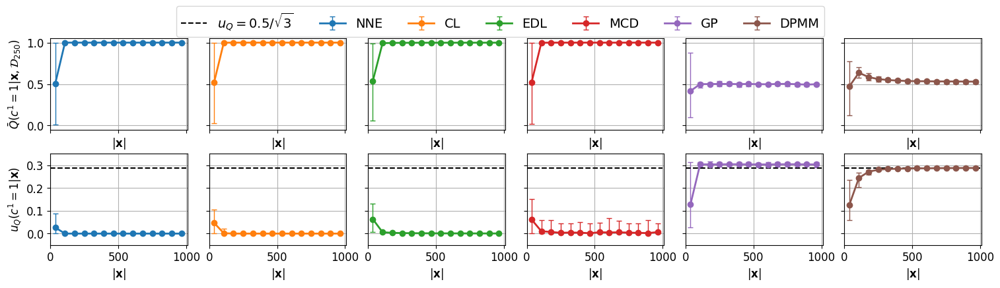

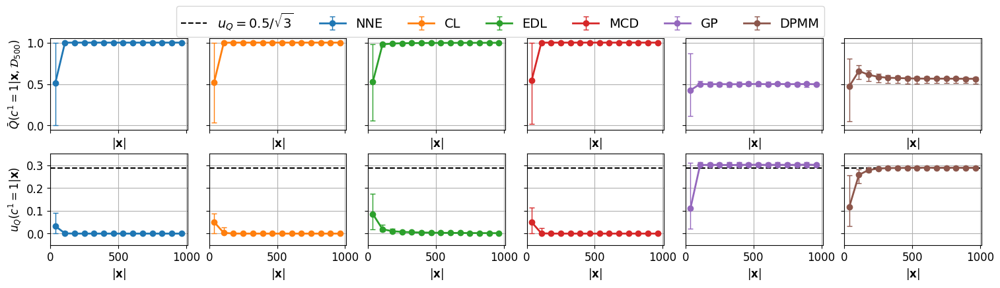

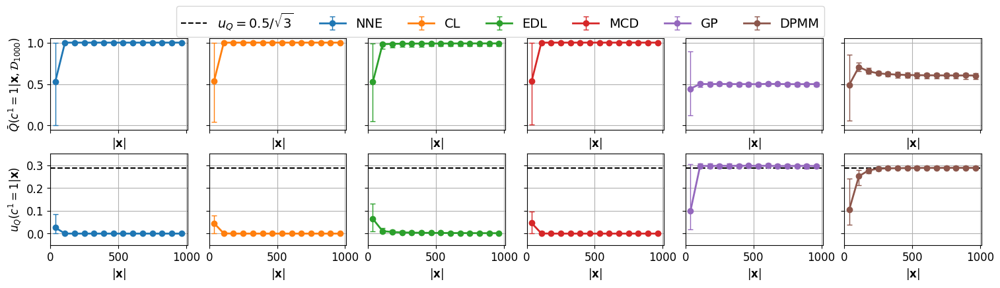

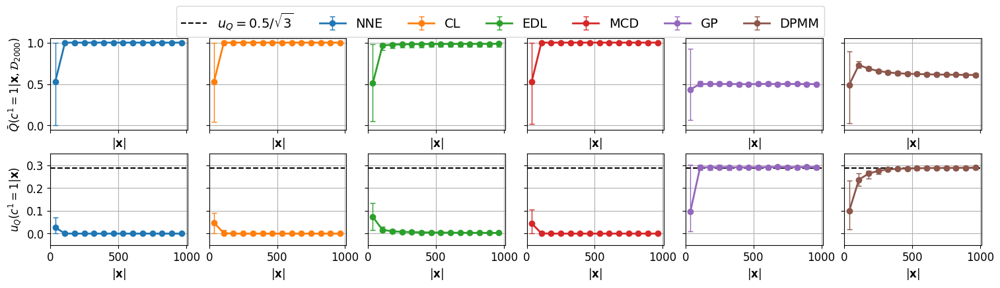

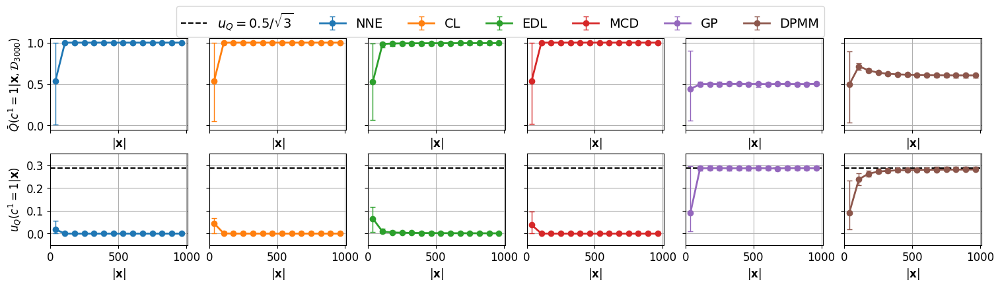

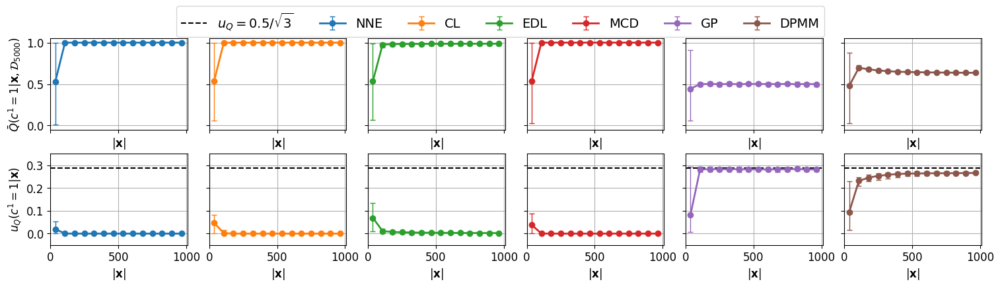

In [67]:
r_plots(large_grid_dfs_B, large_grid_data_B, large_grid_rmax_B, n_train, 
        dataset_name="datasetB", grid=True)

In [68]:
def metric_plot(dfs_1, dfs_2, best_1, best_2, filename:str):
    #Also uses global variables
    metric_keys = ["ACC", "ROCAUC", "LogLoss", "Mean KL-div", "ECE", "WD", "Q-P dist", "Z", "Avg UE"]
    metric_labels = ["ACC", "ROCAUC", "LogLoss", "KL-div", "ECE", "WD", "Q-P dist",  "Z", "UE"]
    fig, axs = plt.subplots(nrows = len(metric_keys), ncols = n_models, figsize = (2*n_models,1.7*len(metric_keys)), layout="constrained", sharex=True, sharey="row")
    for i in range(n_models):
        axs[0][i].set_title(model_names[i], fontsize=14)
        for j in range(len(metric_keys)):
            axs[j][i].plot(dfs_1[i]["N data"], dfs_1[i][f"{metric_keys[j]}"], c="#ff7f00", label="A") #orange
            axs[j][i].plot(dfs_2[i]["N data"], dfs_2[i][f"{metric_keys[j]}"], c="#377eb8", label="B") #blue
            #axs[0][i].set_ylim(0.6, 0.8)
            
    for col in axs[-1]:
        col.set_xlabel(r"N$_{\mathrm{train}}$")

    for ax in axs.flatten():
        ax.set_xscale("log")
    
    axs[0][0].legend(loc="lower right")

    for j in range(len(metric_keys)):
        key = metric_keys[j]
        axs[j][0].set_ylabel(f"{metric_labels[j]}", fontsize=14)
        #Mark best model
        if (j < (len(metric_keys)-1)):
            for n in range(n_plots):
                best_model_1 = int(best_1[metric_keys[j]][n])
                axs[j, best_model_1].scatter(x=[n_train[n]], y=[dfs_1[best_model_1][key][n]], marker='*', s=15, c="red")
                best_model_2 = int(best_2[metric_keys[j]][n])
                axs[j, best_model_2].scatter(x=[n_train[n]], y=[dfs_2[best_model_2][key][n]], marker='o', s=15, c="red")

    fig.savefig(f"fig/{filename}.pdf", format="pdf", bbox_inches='tight', dpi=350)

In [69]:
#metric_plot(scores_A, scores_B, best_score_A, best_score_B, "results_datasetAB_metrics")

In [70]:
def metric_plot_v2(dfs, max_acc, filename:str, tails=False):
    #Also uses global variables
    if tails:
        metric_keys = ["ACC tails", "ECE tails", "LogLoss tails", 
                   "Q-P dist tails", "WD tails", "Mean KL-div tails"]
        metric_labels = ["ACC tails", "ECE tails", "LogLoss tails",
                     "Z tails", "WD tails", "KL-div tails"]
    else:
        metric_keys = ["ACC", "ECE", "LogLoss", 
                    "Z", "WD", "Mean KL-div"]
        metric_labels = ["ACC", "ECE", "LogLoss",
                        "Z", "WD", "KL-div"]
    fig, axs = plt.subplots(nrows = 2, ncols = 3, figsize = (10, 5.5), layout="constrained", sharex=True)
    
    if not tails:
        #Accuracy plot
        x = [0, n_train[-1]]
        y = [max_acc, max_acc]
        axs[0][0].plot(x, y, linestyle="--", label=f"LRFD ACC={'{0:0.3}'.format(max_acc)}", color="black")
        axs[0][0].legend()
        #Set axes for Z, ECE & WD
        axs[1][0].set_ylim(-0.005, 0.1)
        axs[0][1].set_ylim(0, 0.1)
        axs[1][1].set_ylim(0, 0.1)
        
        #Set axes for ACC
        axs[0][0].set_ylim(0.70, 0.75)

    for ax in axs.flatten():
        ax.set_xscale("log")
        ax.set_xlim(200, 11000)
        ax.grid(True)

    for ax in axs[1]:
        ax.set_xlabel(r"N$_{\mathrm{train}}$", fontsize=14)
    # Plot results
    for i in range(len(metric_keys)):
        ax = axs.flatten()[i]
        #ax.set_title(metric_labels[i], fontsize=14)
        for j in range(n_models):
            ax.plot(dfs[j]["N data"], dfs[j][f"{metric_keys[i]}"], label=model_names[j], marker="s")
            #axs[0][i].set_ylim(0.6, 0.8)
        ax.set_ylabel(f"{metric_labels[i]}", fontsize=14)
        
    #axs[0][0].legend(bbox_to_anchor=(0, 1, 1, 0), loc="lower left", mode="expand", ncol=6)
    handles, labels = axs[-1][-1].get_legend_handles_labels()
    fig.suptitle("    ", fontsize=26)
    fig.legend(handles, labels, loc='upper center', ncol=6, labelspacing=0., fontsize=14)

    if tails:
        fig.savefig(f"fig/{filename}_tails.pdf", format="pdf", bbox_inches='tight', dpi=350)
        fig.savefig(f"fig/{filename}_tails.png", format="png", bbox_inches='tight', dpi=350)
    else: 
        fig.savefig(f"fig/{filename}.pdf", format="pdf", bbox_inches='tight', dpi=350)
        fig.savefig(f"fig/{filename}.png", format="png", bbox_inches='tight', dpi=350)

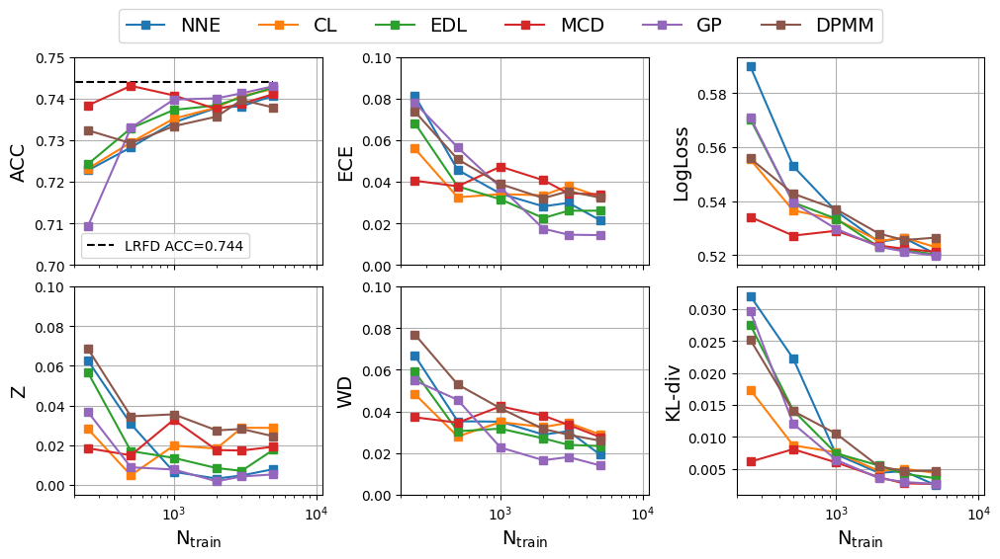

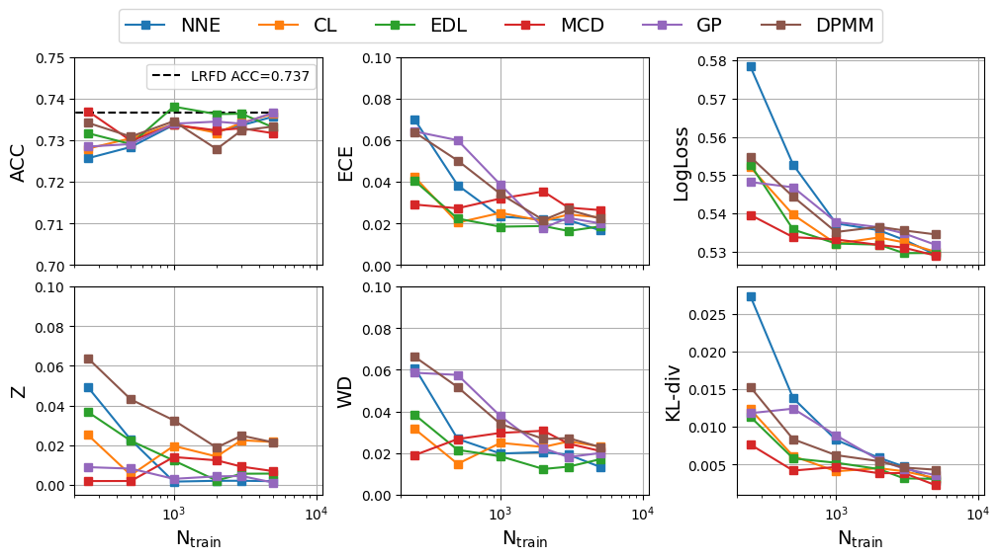

In [71]:
metric_plot_v2(scores_A, max_acc_A, filename=f"metric_plots_datasetA_{ACTIVATION}")
metric_plot_v2(scores_B, max_acc_B, filename=f"metric_plots_datasetB_{ACTIVATION}")

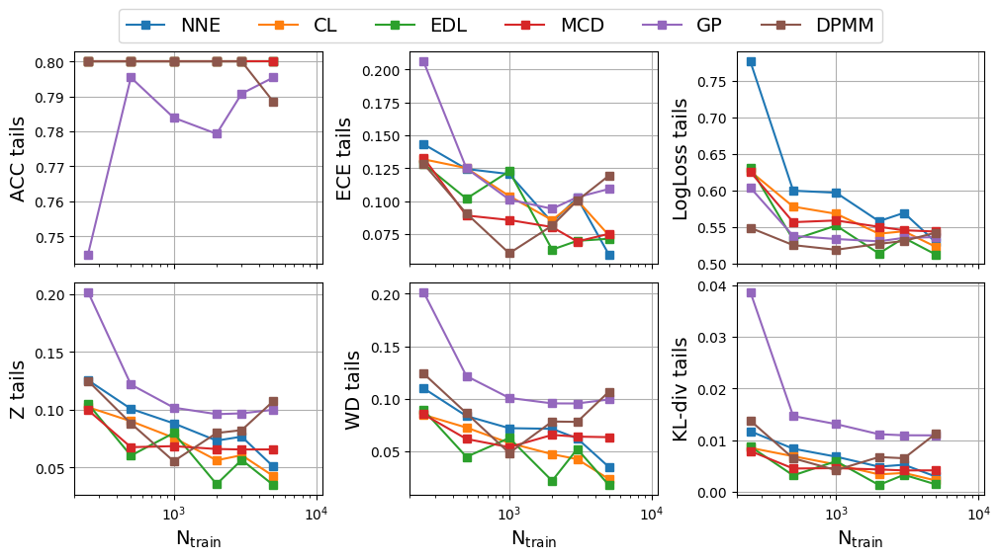

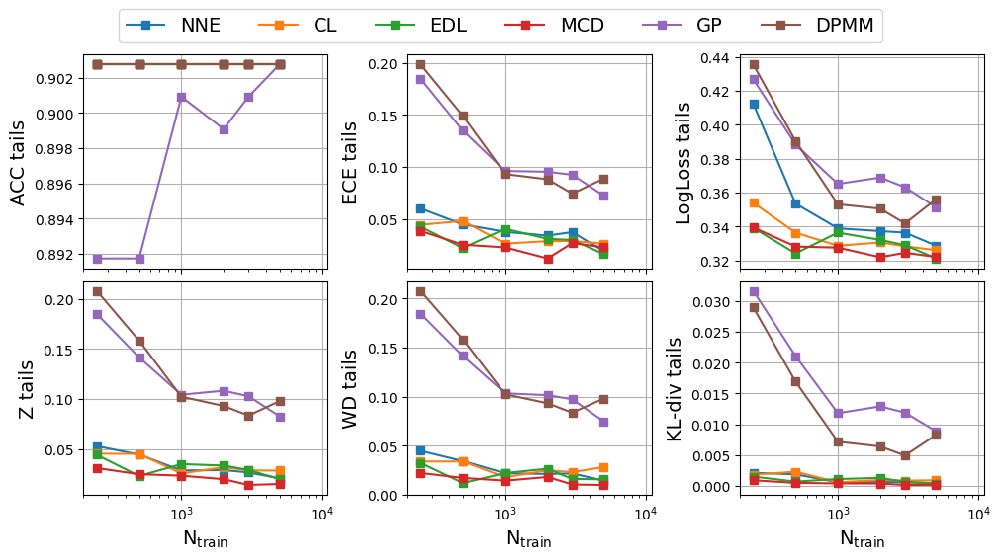

In [72]:
metric_plot_v2(scores_A, max_acc_A, filename=f"metric_plots_datasetA_{ACTIVATION}", tails=True)
metric_plot_v2(scores_B, max_acc_B, filename=f"metric_plots_datasetB_{ACTIVATION}", tails=True)

## Smaller test set

In [73]:
#metric_plot(scores_A_small, scores_B_small, best_score_A_small, best_score_B_small, "results_datasetAB_small_metrics")

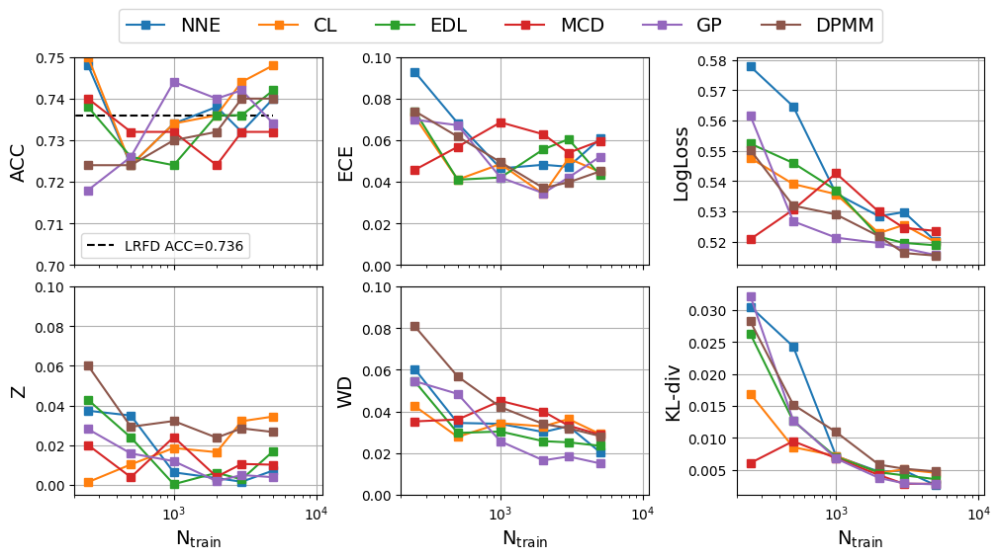

In [74]:
metric_plot_v2(scores_A_small, max_acc_A_small, filename=f"metric_plots_datasetA_small_{ACTIVATION}")
#metric_plot_v2(scores_B_small, max_acc_B_small, filename="metric_plots_datasetB_small")

In [75]:
def uncertainties_plot(dfs, filename:str):
    #Also uses global variables
    fig, axs = plt.subplots(nrows = 2, ncols = 3, figsize = (12, 6), layout="constrained", sharex=True)

    #ax.set_title(metric_labels[i], fontsize=14)
    capsize = 3
    for j in range(n_models):
        axs[0][0].errorbar(dfs[j]["N data"], dfs[j][f"Avg Q"], 
                           yerr=(dfs[j][f"Avg Q"] - dfs[j][f"Err Q down"], dfs[j][f"Err Q up"] - dfs[j][f"Avg Q"]),
                            linewidth=2, elinewidth=1, capsize = capsize, marker="o", color=model_colors[j], label = model_names[j])
        axs[0][0].set_ylabel(r"Average $\bar{Q}$ test", fontsize=14)

        axs[0][1].errorbar(dfs[j]["N data"], dfs[j][f"Avg Q OOD"], 
                           yerr=(dfs[j][f"Avg Q OOD"] - dfs[j][f"Err Q OOD down"], dfs[j][f"Err Q OOD up"] - dfs[j][f"Avg Q OOD"]),
                            linewidth=2, elinewidth=1, capsize = capsize, marker="o", color=model_colors[j], label = model_names[j])
        axs[0][1].set_ylabel(r"Average $\bar{Q}$ OOD near", fontsize=14)

        axs[0][2].errorbar(dfs[j]["N data"], dfs[j][f"Avg Q OODx"], 
                            yerr=(dfs[j][f"Avg Q OODx"] - dfs[j][f"Err Q OODx down"], dfs[j][f"Err Q OODx up"] - dfs[j][f"Avg Q OODx"]),
                            linewidth=2, elinewidth=1, capsize = capsize, marker="o", color=model_colors[j], label = model_names[j])
        axs[0][2].set_ylabel(r"Average $\bar{Q}$ OOD far", fontsize=14)

        axs[1][0].errorbar(dfs[j]["N data"], dfs[j][f"Avg UE"], 
                           yerr=(dfs[j][f"Avg UE"] - dfs[j][f"Err UE down"], dfs[j][f"Err UE up"] - dfs[j][f"Avg UE"]),
                            linewidth=2, elinewidth=1, capsize = capsize, marker="o", color=model_colors[j], label = model_names[j])
        axs[1][0].set_ylabel(r"Average $u_Q$", fontsize=14)

        axs[1][1].errorbar(dfs[j]["N data"], dfs[j][f"Avg UE OOD"], 
                            yerr=(dfs[j][f"Avg UE OOD"] - dfs[j][f"Err UE OOD down"], dfs[j][f"Err UE OOD up"] - dfs[j][f"Avg UE OOD"]),
                            linewidth=2, elinewidth=1, capsize = capsize, marker="o", color=model_colors[j], label = model_names[j])
        axs[1][1].set_ylabel(r"Average $u_Q$ OOD near", fontsize=14)

        axs[1][2].errorbar(dfs[j]["N data"], dfs[j][f"Avg UE OODx"], 
                            yerr=(dfs[j][f"Avg UE OODx"] - dfs[j][f"Err UE OODx down"], dfs[j][f"Err UE OODx up"] - dfs[j][f"Avg UE OODx"]),
                            linewidth=2, elinewidth=1, capsize = capsize, marker="o", color=model_colors[j], label = model_names[j])
        axs[1][2].set_ylabel(r"Average $u_Q$ OOD far", fontsize=14)
        
        capsize = capsize + 1
        
    for ax in axs.flatten():
        ax.tick_params(labelsize=12)
        ax.set_xscale("log")
        ax.set_xlim(200, 11000)
        ax.grid(True)

    for ax in axs[0]:
        ax.set_ylim(0.4, 1.05)
        ax.set_yticks([0, 0.25, 0.50, 0.75, 1.0])
    for ax in axs[1]:
        ax.set_xlabel(r"N$_{\mathrm{train}}$", fontsize=14)
        ax.set_ylim(-0.05, 0.35)
        ax.set_yticks([0, 0.1, 0.2, 0.3])
        ax.errorbar([0, 11000], [np.sqrt(0.5*0.5/3), np.sqrt(0.5*0.5/3)], yerr=0, xerr=0, 
                    marker=None, capsize=0, elinewidth=0,
                    linestyle="--", color="black", label=r"$u_Q = 0.5/\sqrt{3}$")

    handles, labels = axs[1][1].get_legend_handles_labels()
    fig.suptitle("    ", fontsize=30)
    fig.legend(handles, labels, loc='upper center', ncol=len(handles), labelspacing=0., fontsize=14)
    #axs[1].get_legend().remove()
    
    fig.savefig(f"fig/{filename}.pdf", format="pdf", bbox_inches='tight', dpi=350)
    fig.savefig(f"fig/{filename}.png", format="png", bbox_inches='tight', dpi=350)

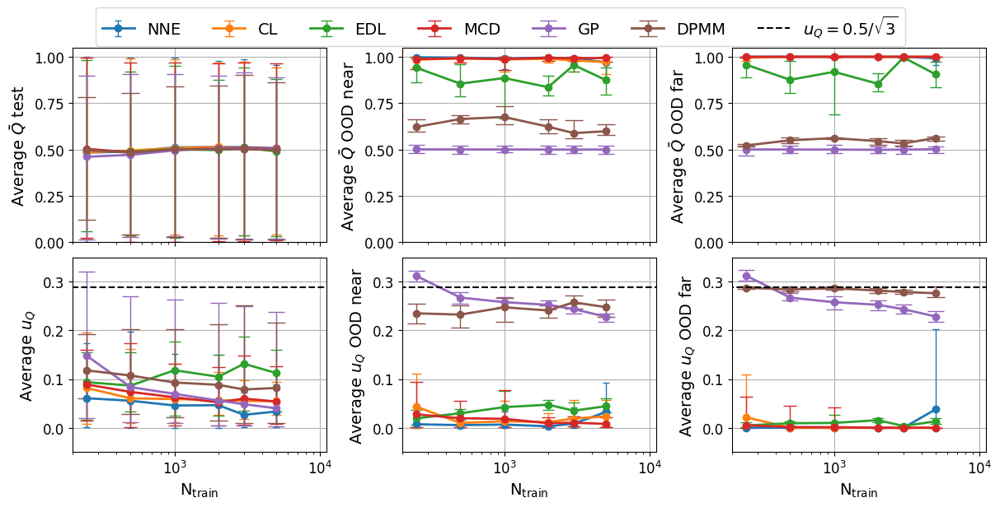

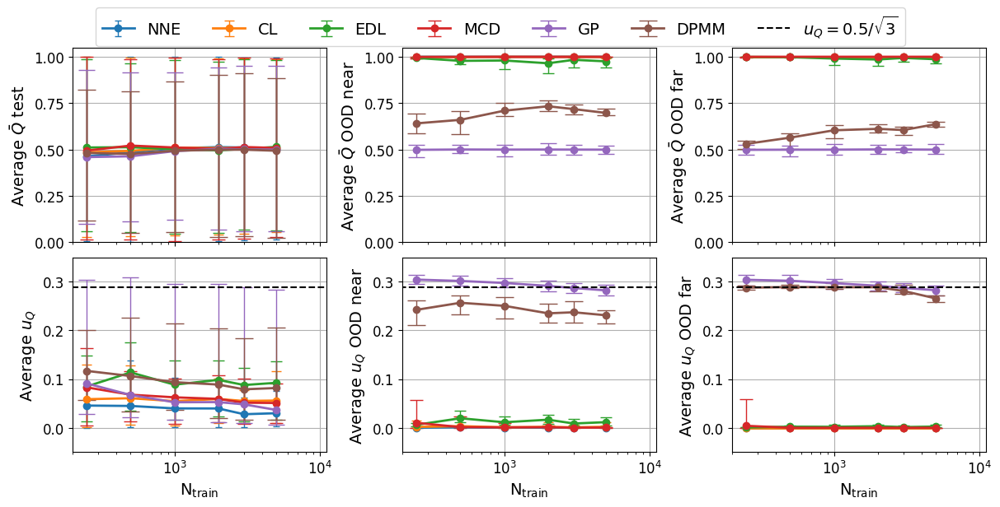

In [76]:
uncertainties_plot(scores_A, filename=f"uncertainties_datasetA_{ACTIVATION}")
uncertainties_plot(scores_B, filename=f"uncertainties_datasetB_{ACTIVATION}")

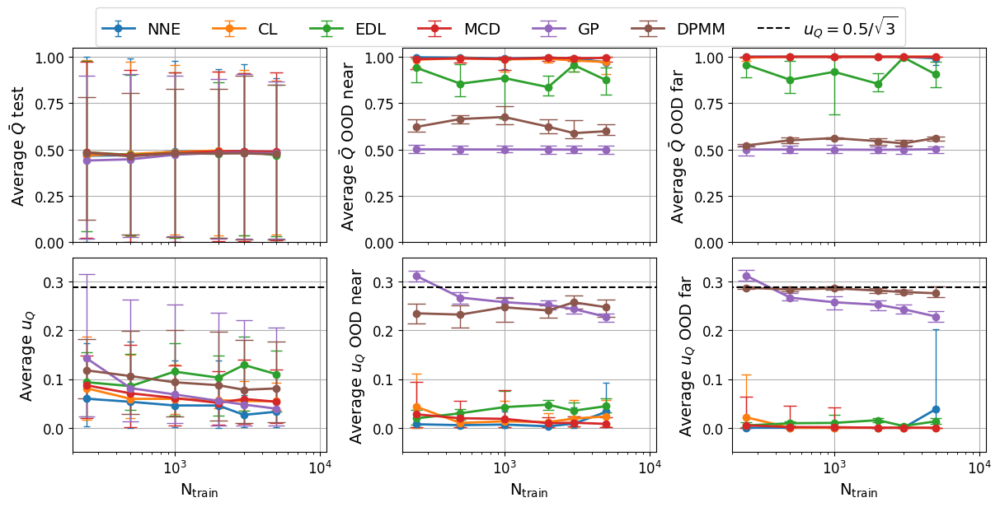

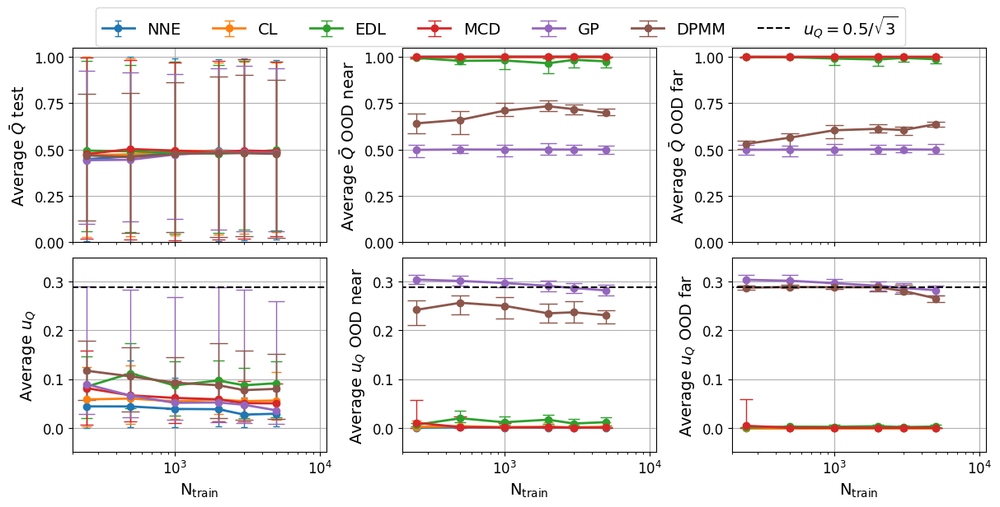

In [77]:
uncertainties_plot(scores_A_small, filename=f"uncertainties_datasetA_small_{ACTIVATION}")
uncertainties_plot(scores_B_small, filename=f"uncertainties_datasetB_small_{ACTIVATION}")

In [78]:
from sklearn.calibration import CalibrationDisplay
from sklearn.calibration import calibration_curve

def reliability_diagrams(test_dfs, filename):
    for i in range(len(n_train)):
        fig, ax = plt.subplots(nrows=2, ncols=6, figsize=(12, 3), height_ratios=[3, 1], 
                                sharex=True, sharey="row", layout="constrained")
        for j in range(len(test_dfs)): # model
            prob_true, prob_pred = calibration_curve(test_dfs[j][i]["class"], test_dfs[j][i]["Est_prob_c1"], 
                                                    n_bins=15, strategy="uniform")
            pred_bins=list(prob_pred)

            ax[0][j].plot(prob_pred, prob_true, linewidth=2, markersize=5, marker="o", label =f"{model_names[j]}", color=model_colors[j])
            x = np.linspace(0, 1, 10)
            ax[0][j].plot(x, x, color="black", linestyle="--")
            ax[0][j].set_ylim(0,1)

            #ax[0][i].set_ylabel("Fraction of positives", fontsize=14)
            ax[0][j].legend()

            sn.histplot(test_dfs[j][-1]["Est_prob_c1"], ax=ax[1][j], stat="count", bins=pred_bins, binrange=(0,1))
            ax[1][j].set_ylabel("Count", fontsize=14)
            ax[1][j].set_xlabel(rf"$\bar{{Q}}(c^2=1|\mathbf{{x}}, \mathcal{{D}}_{{{n_train[i]}}}$)", fontsize=14)

        for axis in ax.flatten():
            axis.tick_params(which="major", direction="out", bottom=True, left=True, pad=5, length=6, width=1, labelsize=12)
            axis.set_xlim(0, 1)
            axis.grid(True)
            
        ax[0][0].set_ylabel(r"$\hat{\nu}$", fontsize=14)
        plt.plot()
        fig.savefig(f"fig/{filename}_{n_train[i]}.pdf", format="pdf", bbox_inches='tight', dpi=350)
        fig.savefig(f"fig/{filename}.png", format="png", bbox_inches='tight', dpi=350)

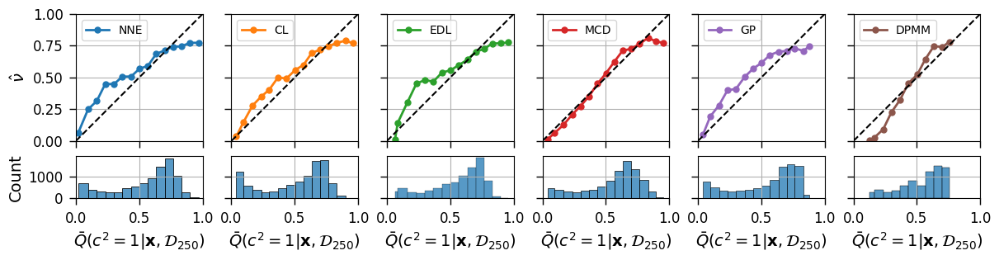

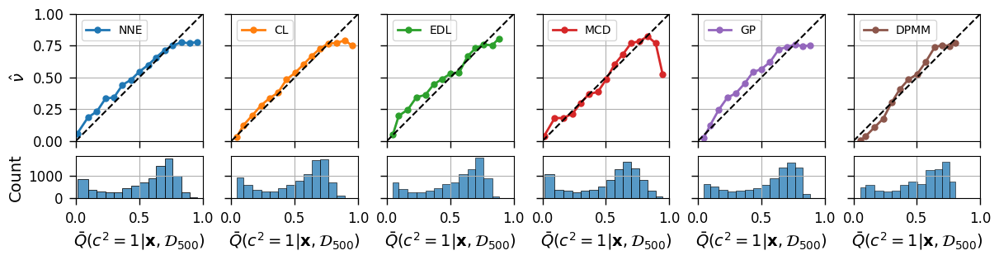

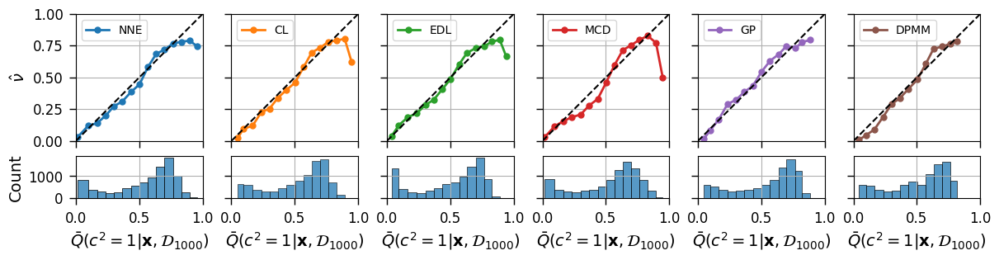

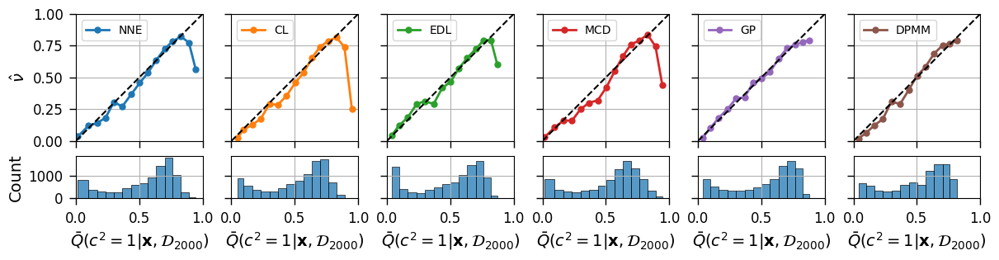

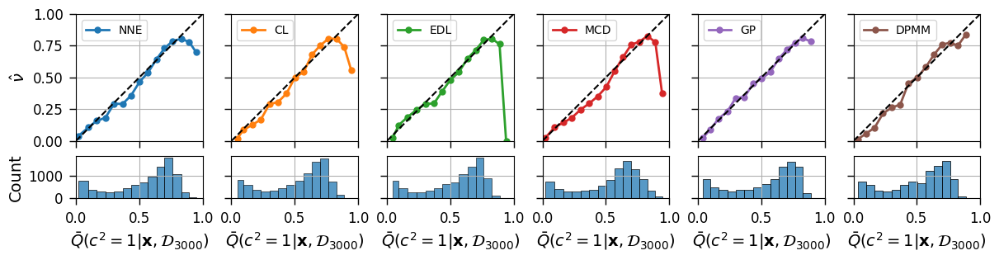

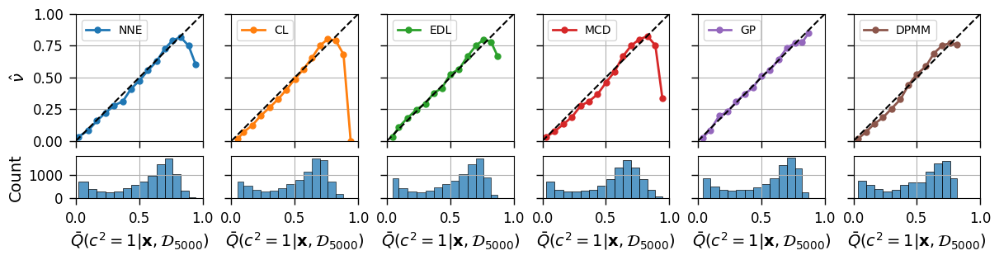

In [79]:
reliability_diagrams(test_dfs_A, filename=f"reliability_diagrams_datasetA_{ACTIVATION}")


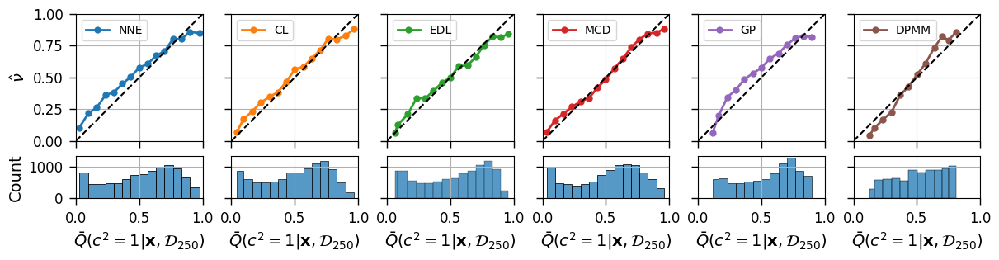

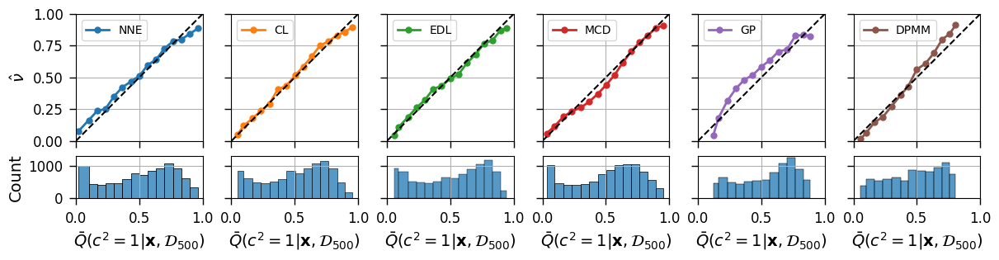

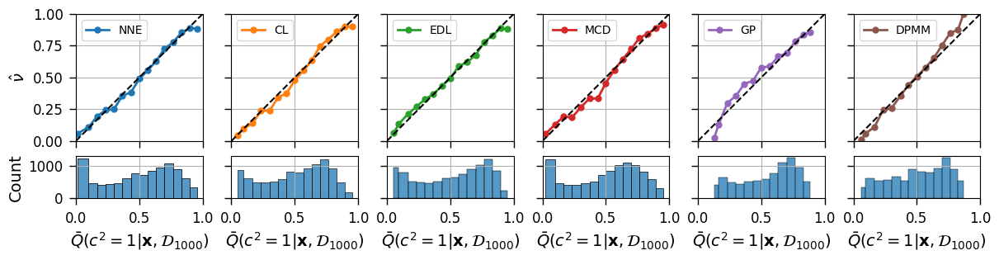

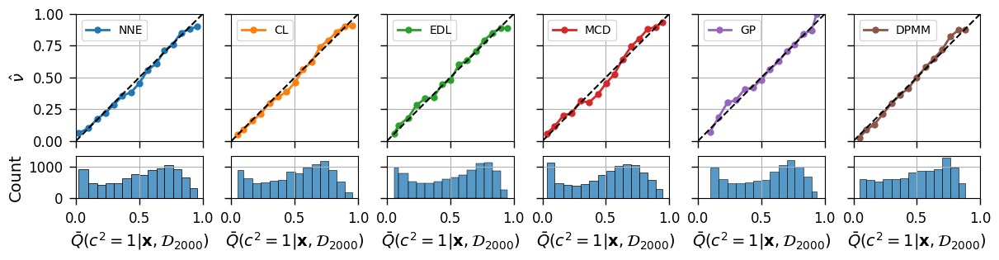

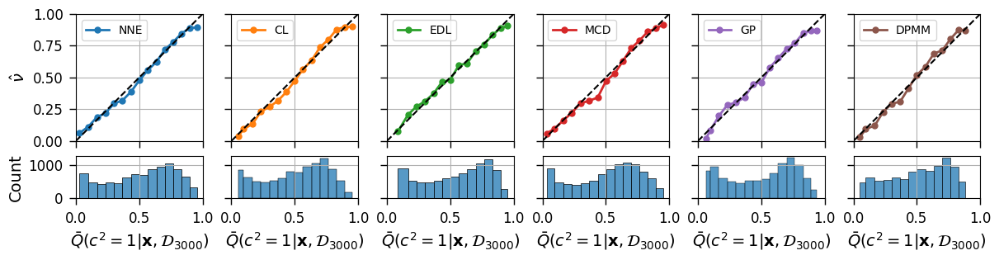

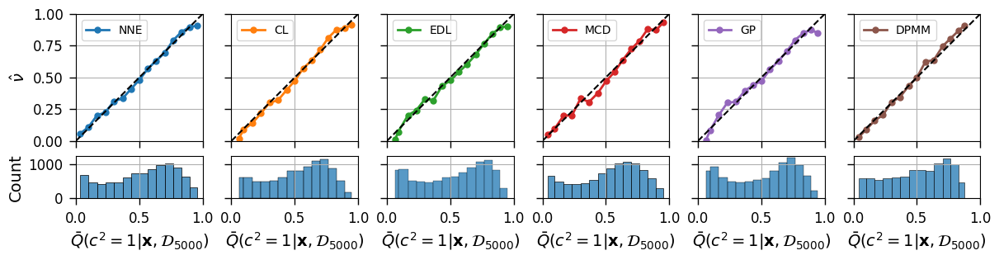

In [80]:
reliability_diagrams(test_dfs_B, filename=f"reliability_diagrams_datasetB_{ACTIVATION}")

In [81]:
def grid_plots(grid_dfs, grid_data, grid_xmax, dataset_name:str):
    # A horrible function which uses global variables because I am too lazy

    for i in range(n_plots):
        fig, axs = plt.subplots(nrows = 3, ncols = n_models, figsize = (1.7*n_models,1.7*3), layout="constrained", sharey=True, sharex=True)
        for j in range(n_models):
            axs[0][j] = plot_results(grid_dfs[j][i], prob_keys[j], axs[0][j], "", grid=True, rmax=grid_xmax)
            axs[1][j] = plot_diff(grid_dfs[j][i], grid_data, prob_keys[j], "p_c1_given_r",  axs[1][j], r"", max_val=max_err_val[-1], rmax=grid_xmax, absolute=True)
            axs[2][j] = plot_std(grid_dfs[j][i], std_keys[j], axs[2][j], r"", grid=True, max_val=max_err_val[-1], rmax=grid_xmax)
            axs[0][j].set_title(model_names[j])

        for ax in axs.flatten():
            ax.tick_params(labelsize=10, bottom=True, left=True, top=False, right=False)

        for ax in axs:
            ax[0].set_ylabel(r"$x^2$", fontsize=12)
        for ax in axs[-1]:
            ax.set_xlabel(r"$x^1$", fontsize=12)
        
        hue_norm_prob = mpl.colors.Normalize(vmin=0, vmax=1, clip=False)
        fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm_prob, cmap=red_blue_cmap()),  fraction=0.050, pad=0.04,
                    label=r"$\bar{Q}(c^1=1|\mathbf{x})$", ax=axs[0][-1],
                    format=mpl.ticker.StrMethodFormatter("{x:.2f}"))
        
        hue_norm_std = mpl.colors.Normalize(vmin=0.00, vmax=0.30, clip=False)
        fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm_std, cmap="inferno"),  fraction=0.050, pad=0.04,
                    label=r"$|\bar{Q}(c^1=1|\mathbf{x})-\nu_{\infty}(\mathbf{x})|$", ax=axs[1][-1],
                    format=mpl.ticker.StrMethodFormatter("{x:.2f}"))
        
        hue_norm_err = mpl.colors.Normalize(vmin=0.00, vmax=0.30, clip=False)
        fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm_err, cmap="inferno"),  fraction=0.050, pad=0.04,
                    label=r"$u_Q(\mathbf{x})$", ax=axs[2][-1],
                    format=mpl.ticker.StrMethodFormatter("{x:.2f}"))
        fig.suptitle(f"Number of training data points: {n_train[i]}", fontsize=16)
        fig.savefig(f"fig/results_{dataset_name}_grid_{n_train[i]}_{ACTIVATION}.pdf", format="pdf", bbox_inches='tight', dpi=350)


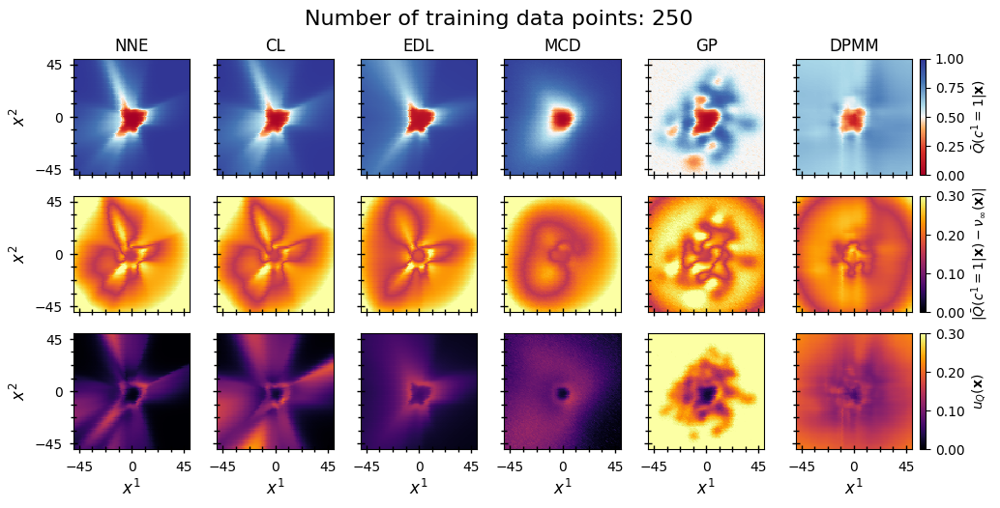

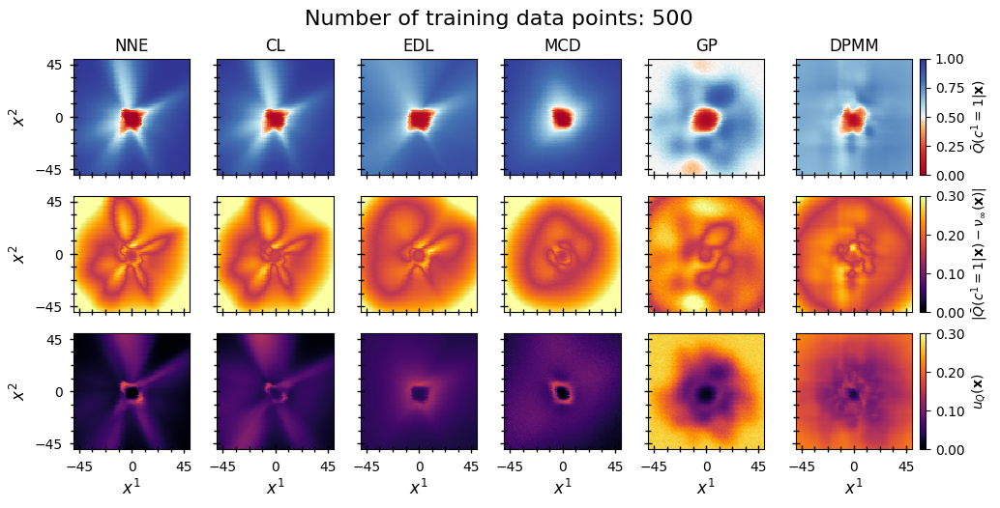

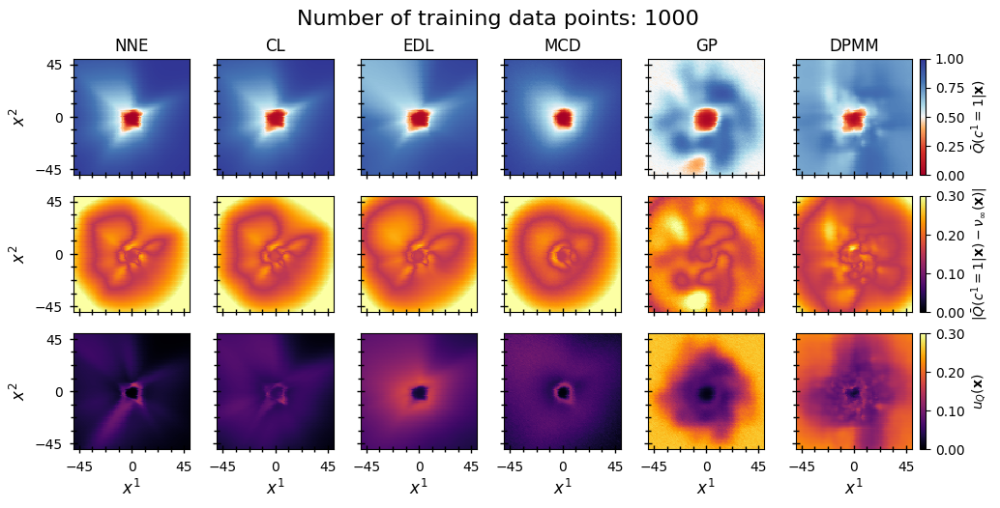

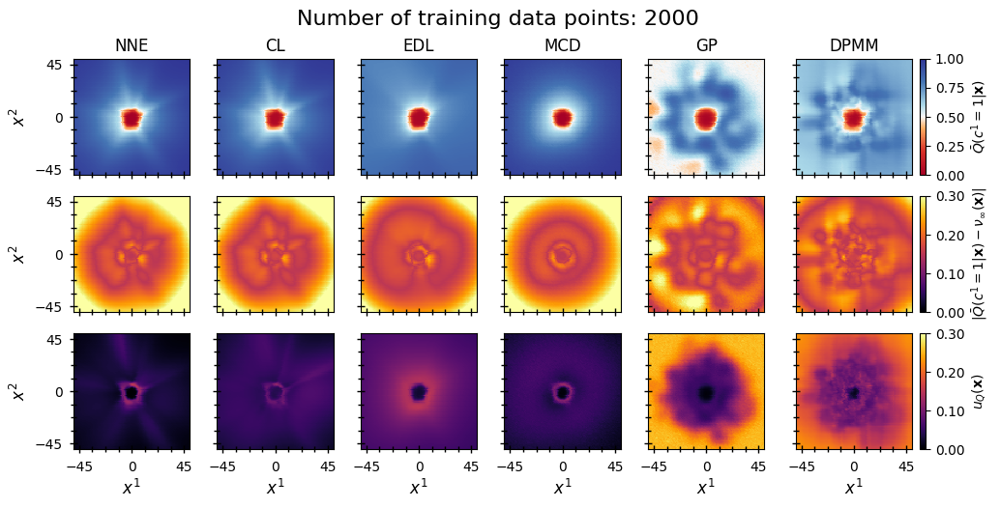

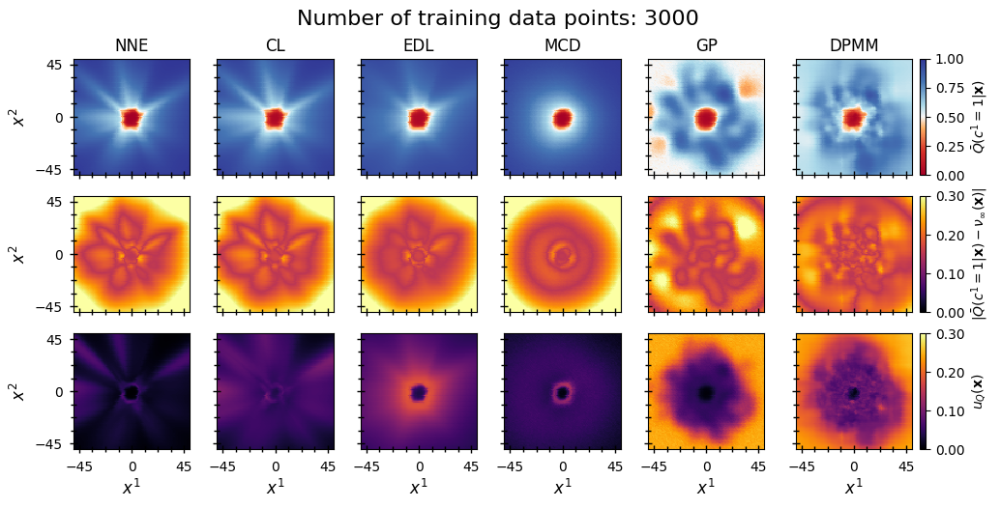

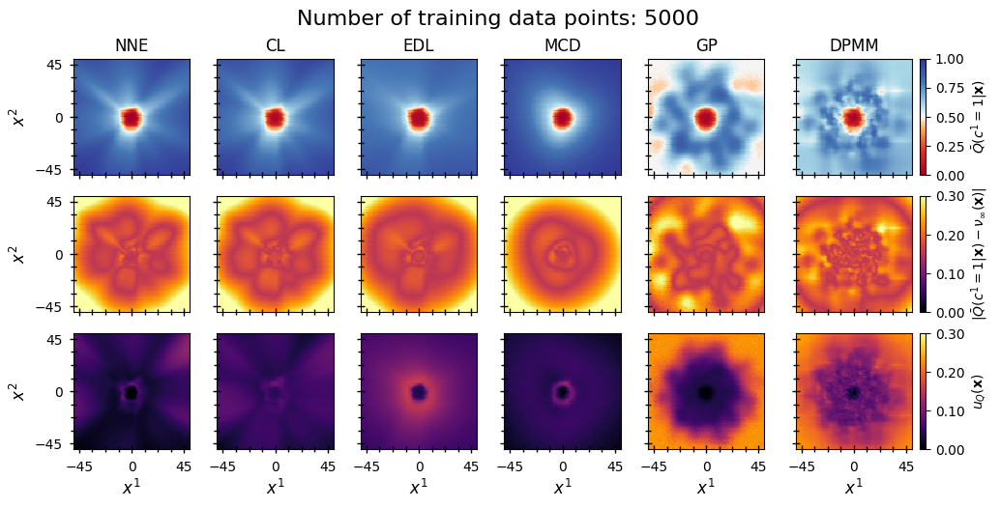

In [82]:
grid_plots(grid_dfs_A, grid_data_A, grid_xmax_A, "datasetA")

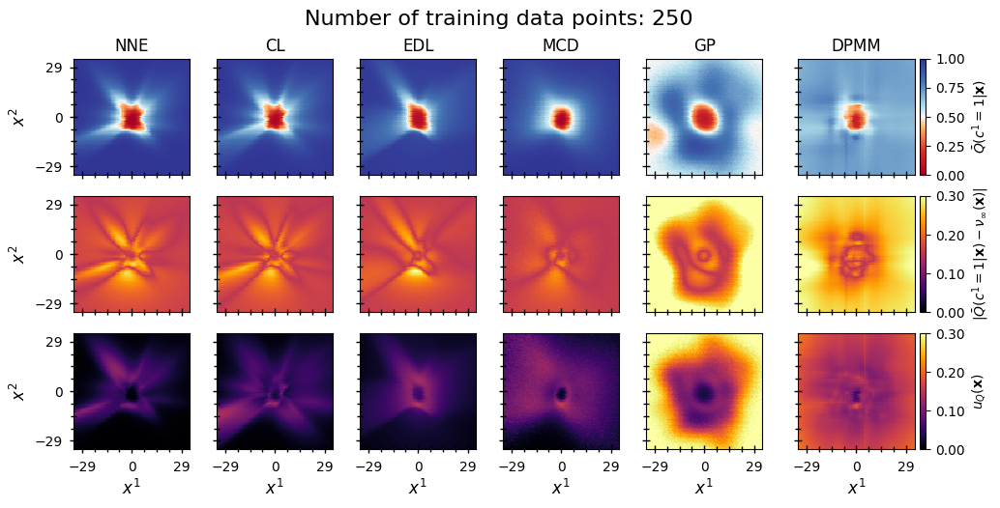

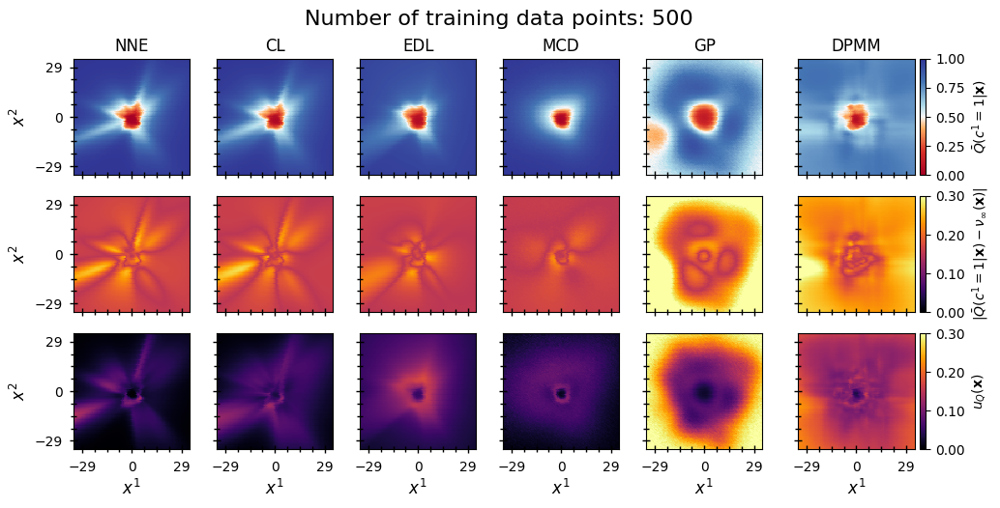

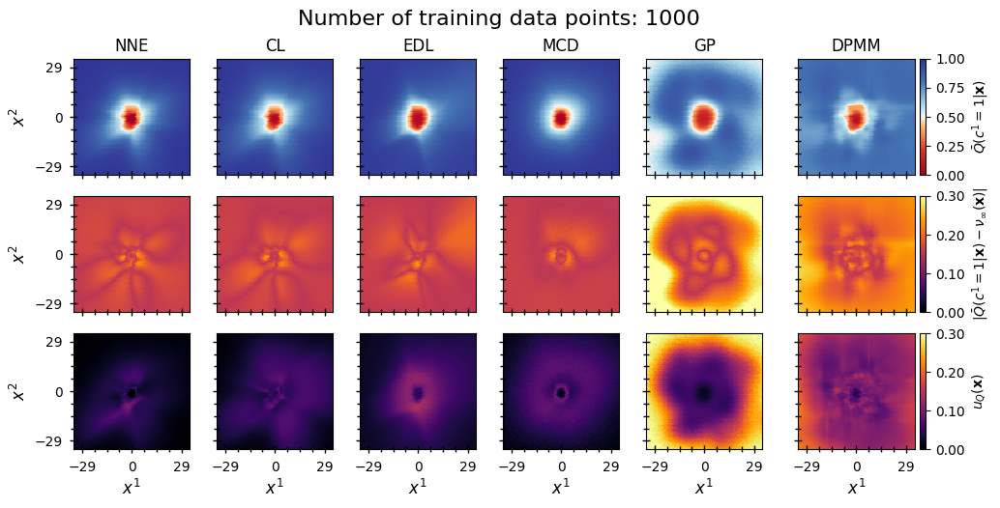

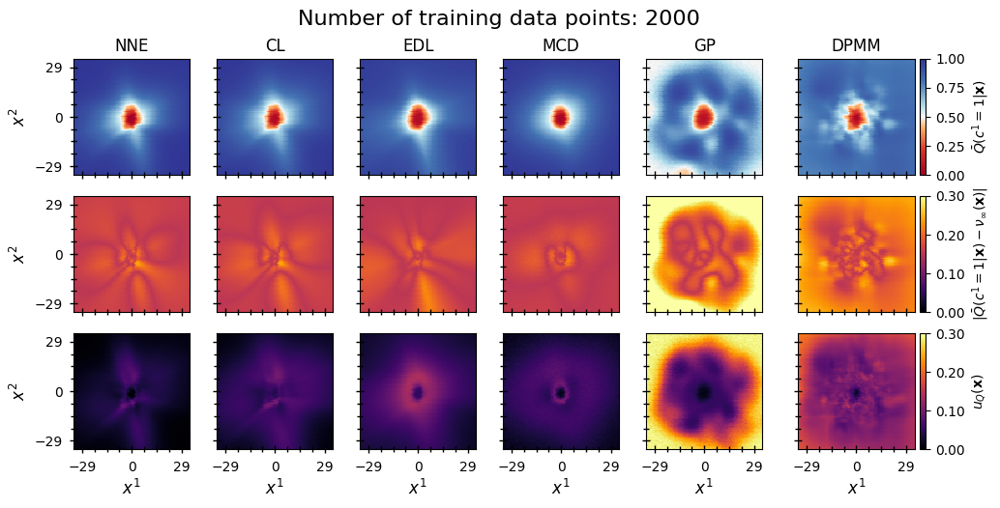

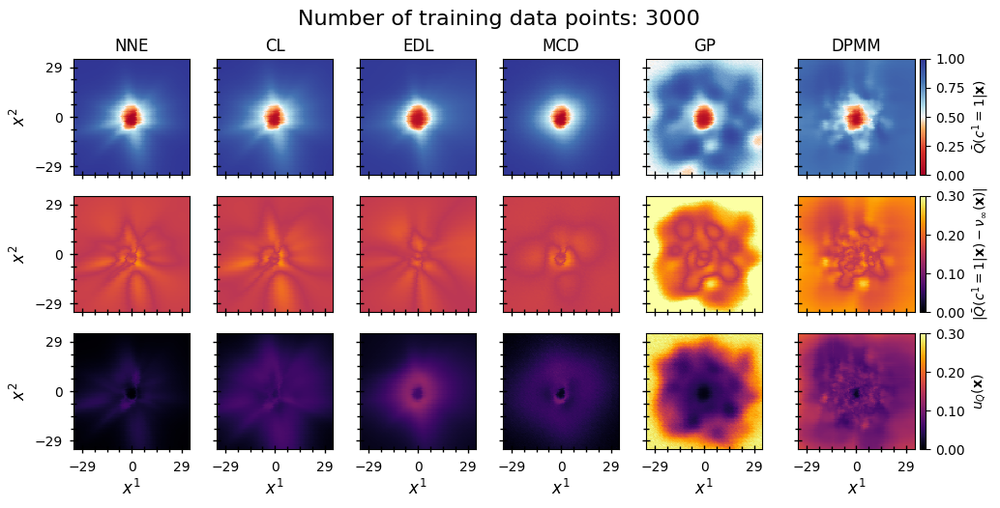

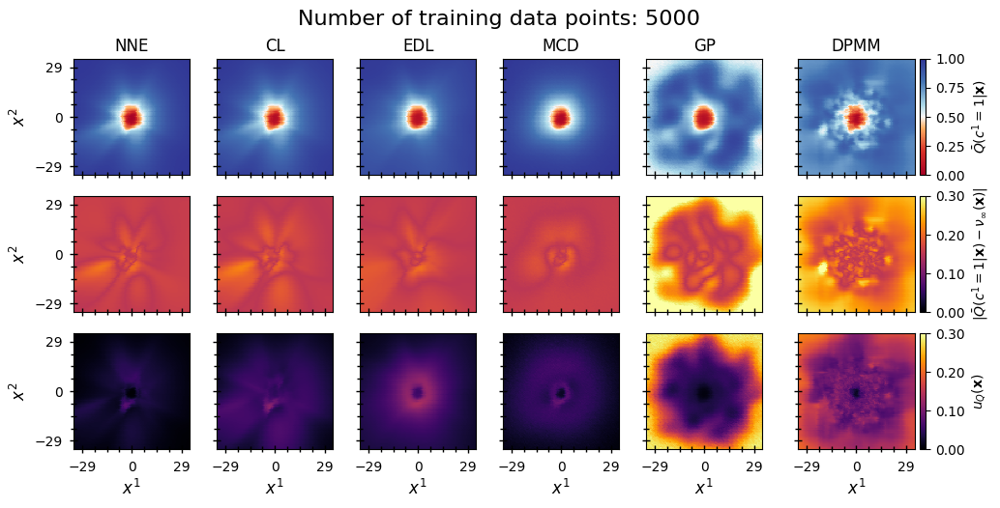

In [83]:
grid_plots(grid_dfs_B, grid_data_B, grid_xmax_B, "datasetB")